# For all the projects we should have more training and testing images to have more accurate results and help the CNN with features detection. 

In [1]:
from tensorflow.keras.optimizers import Adam
%matplotlib inline
import glob
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import imageio as im
from keras import models
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Dropout
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint

# Circles

C:\Users\Admin\AppData\Local\Temp/ipykernel_23404/2832542077.py:8: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(len(images) / columns + 1, columns, i + 1)


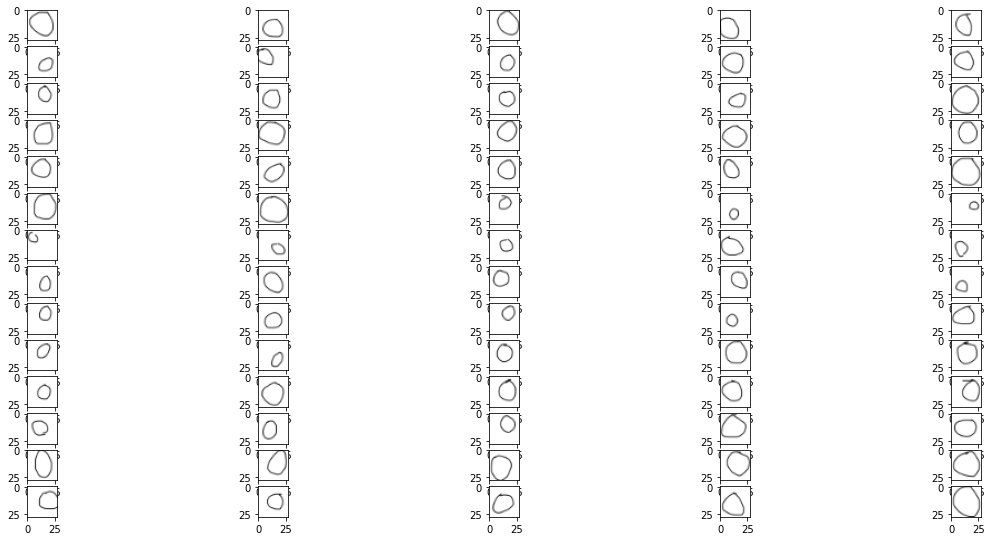

In [2]:
images = []
for img_path in glob.glob('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Training_set/Circles/*.png'):
    images.append(mpimg.imread(img_path))

plt.figure(figsize=(20,10))
columns = 5
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image)

# Squares

C:\Users\Admin\AppData\Local\Temp/ipykernel_23404/2645302186.py:7: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(len(images) / columns + 1, columns, i + 1)


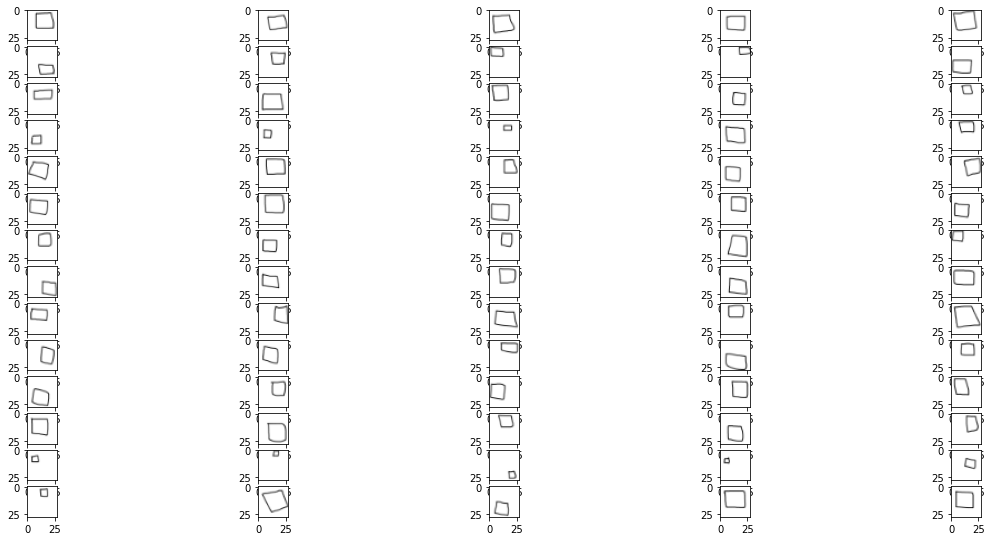

In [3]:
images = []
for img_path in glob.glob('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Training_set/squares/*.png'):
    images.append(mpimg.imread(img_path))
plt.figure(figsize=(20,10))
columns = 5
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image)

# Triangles

C:\Users\Admin\AppData\Local\Temp/ipykernel_23404/3152268039.py:8: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(len(images) / columns + 1, columns, i + 1)


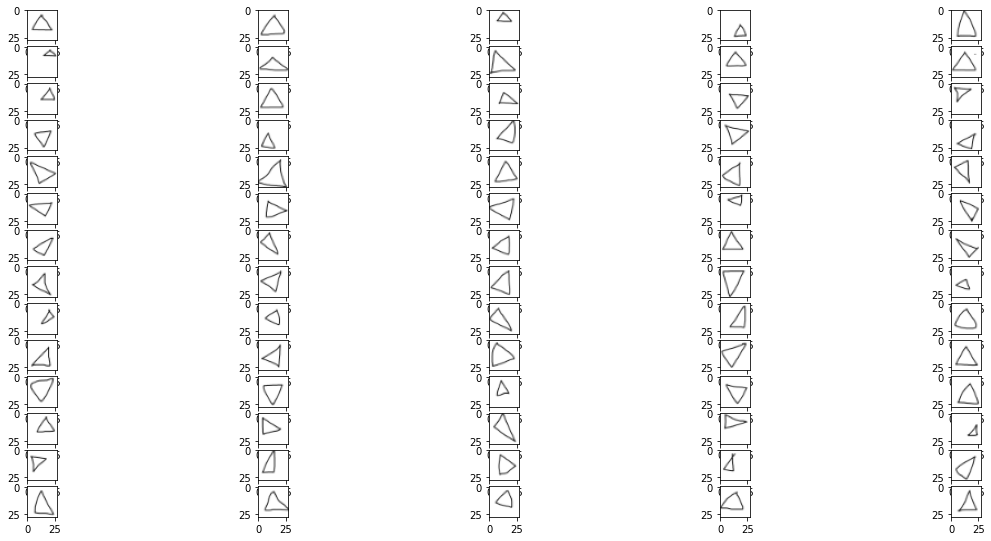

In [4]:
images = []
for img_path in glob.glob('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Training_set/triangles/*.png'):
    images.append(mpimg.imread(img_path))

plt.figure(figsize=(20,10))
columns = 5
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image)

# The shape of the images:

In [5]:
img = im.imread('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Training_set/squares/drawing(2).png')
img.shape

(28, 28, 3)

(28, 28, 3) Images shapes are of 28 pixels by 28 pixels in RGB scale (although they are arguably black and white only)

# Initialising the CNN

In [83]:
classifier = Sequential()

# Step 1 - Convolution

In [84]:
classifier.add(Conv2D(32, (3, 3), padding='same', input_shape = (28, 28, 3), activation = 'relu'))
classifier.add(MaxPooling2D(pool_size=(2, 2)))
classifier.add(Dropout(0.5)) # antes era 0.25

# Adding a second convolutional layer
classifier.add(Conv2D(64, (3, 3), padding='same', activation = 'relu'))
classifier.add(MaxPooling2D(pool_size=(2, 2)))
classifier.add(Dropout(0.5)) # antes era 0.25

# Adding a third convolutional layer
classifier.add(Conv2D(64, (3, 3), padding='same', activation = 'relu'))
classifier.add(MaxPooling2D(pool_size=(2, 2)))
classifier.add(Dropout(0.5)) # antes era 0.25

# Step 3 - Flattening
classifier.add(Flatten())
#note that after flattening the data to 1D we change the type of layers to dense. 
# Step 4 - Full connection
classifier.add(Dense(units = 512, activation = 'relu'))
classifier.add(Dropout(0.5))
#softmax activation since there are more than 2 labels. 
classifier.add(Dense(units = 3, activation = 'softmax')) #3 possible outputs: ('Circles': 0, 'squares': 1, 'triangles': 2)

For this type of images, I might be building an overly complex structure, and that will be evident once we take a look at the feature maps, however, it helps me to showcase exactly what each layer will be doing. I used less neurons in the last layer but the accuracy scores were not good. I had to create a super complex model in terms of neurons in order to reach proper accuracy scores. 

Let's take a look at our model summary:

In [85]:
classifier.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 28, 28, 32)        896       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 14, 14, 32)       0         
 g2D)                                                            
                                                                 
 dropout_24 (Dropout)        (None, 14, 14, 32)        0         
                                                                 
 conv2d_22 (Conv2D)          (None, 14, 14, 64)        18496     
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 7, 7, 64)         0         
 g2D)                                                            
                                                                 
 dropout_25 (Dropout)        (None, 7, 7, 64)         

# Compiling the CNN

In [86]:
classifier.compile(optimizer = 'adam',
                   loss = 'categorical_crossentropy', 
                   metrics = ['accuracy'])

# Using ImageDataGenerator to read images from directories

At this point we need to convert our pictures to a shape that the model will accept. For that we use the ImageDataGenerator. We initiate it and feed our images with .flow_from_directory. There are two main folders inside the working directory, called training_set and test_set. Each of those have 3 subfolders called circles, squares and triangles. I have sent 70 images of each shape to the training_set and 30 to the test_set.

In [87]:
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
training_set = train_datagen.flow_from_directory('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Training_set',
                                                 target_size = (28, 28),
                                                 batch_size = 16,
                                                 class_mode = 'categorical')
test_set = test_datagen.flow_from_directory('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Test_dataset',
                                            target_size = (28, 28),
                                            batch_size = 16,
                                            class_mode = 'categorical')

Found 210 images belonging to 3 classes.
Found 90 images belonging to 3 classes.


In [88]:
print(70*3)
print(30*3)

210
90


batch_size = 16

Now it's time to train the model, here we include the callback to our checkpointer

In [89]:
steps_per_epoch = 210 / 16

In [90]:
steps_per_epoch 

13.125

In [91]:
validation_steps = 90 / 16

In [92]:
validation_steps

5.625

In [102]:
from IPython.display import display 

history = classifier.fit(
        training_set,
        steps_per_epoch=13,
        epochs=30,
        validation_data=test_set, validation_steps=5)

Epoch 1/30
13/13 [==============================] - 0s 29ms/step - loss: 0.9197 - accuracy: 0.5825 - val_loss: 0.8817 - val_accuracy: 0.7500
Epoch 2/30
13/13 [==============================] - 0s 27ms/step - loss: 0.8031 - accuracy: 0.7010 - val_loss: 0.7120 - val_accuracy: 0.7250
Epoch 3/30
13/13 [==============================] - 0s 26ms/step - loss: 0.6973 - accuracy: 0.7113 - val_loss: 0.6305 - val_accuracy: 0.7375
Epoch 4/30
13/13 [==============================] - 0s 27ms/step - loss: 0.6374 - accuracy: 0.7216 - val_loss: 0.5978 - val_accuracy: 0.7625
Epoch 5/30
13/13 [==============================] - 0s 27ms/step - loss: 0.6530 - accuracy: 0.7010 - val_loss: 0.5844 - val_accuracy: 0.7500
Epoch 6/30
13/13 [==============================] - 0s 27ms/step - loss: 0.5393 - accuracy: 0.7990 - val_loss: 0.6217 - val_accuracy: 0.7125
Epoch 7/30
13/13 [==============================] - 0s 31ms/step - loss: 0.5342 - accuracy: 0.7990 - val_loss: 0.5319 - val_accuracy: 0.7875
Epoch 8/30
13

And finally, let’s save the final model for usage later:

In [103]:
classifier.save('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/shapes_cnn.h5')

In [104]:
history.history['accuracy']

[0.5824742317199707,
 0.7010309100151062,
 0.7113401889801025,
 0.7216494679450989,
 0.7010309100151062,
 0.7989690899848938,
 0.7989690899848938,
 0.7164948582649231,
 0.7577319741249084,
 0.7989690899848938,
 0.7989690899848938,
 0.7783505320549011,
 0.7061855792999268,
 0.7731958627700806,
 0.8144329786300659,
 0.8350515365600586,
 0.8453608155250549,
 0.8505154848098755,
 0.8350515365600586,
 0.8608247637748718,
 0.8041236996650696,
 0.8350515365600586,
 0.8556700944900513,
 0.8453608155250549,
 0.8969072103500366,
 0.8917526006698608,
 0.8505154848098755,
 0.9020618796348572,
 0.8814433217048645,
 0.9226804375648499]

In [105]:
len(history.history['accuracy'])

30

In [110]:
history.history['accuracy'][-1]

0.9226804375648499

In [106]:
history.history['val_accuracy']

[0.75,
 0.7250000238418579,
 0.737500011920929,
 0.762499988079071,
 0.75,
 0.7124999761581421,
 0.7875000238418579,
 0.800000011920929,
 0.824999988079071,
 0.800000011920929,
 0.800000011920929,
 0.8374999761581421,
 0.862500011920929,
 0.800000011920929,
 0.875,
 0.862500011920929,
 0.862500011920929,
 0.8125,
 0.8500000238418579,
 0.875,
 0.8125,
 0.875,
 0.887499988079071,
 0.9125000238418579,
 0.925000011920929,
 0.862500011920929,
 0.925000011920929,
 0.925000011920929,
 0.8999999761581421,
 0.9125000238418579]

In [111]:
history.history['val_accuracy'][-1]

0.9125000238418579

In [107]:
history.history['loss']

[0.9196696877479553,
 0.8030614256858826,
 0.6972975730895996,
 0.6374197006225586,
 0.6530279517173767,
 0.539340615272522,
 0.5342227816581726,
 0.607642412185669,
 0.5157682299613953,
 0.4566444754600525,
 0.4744398295879364,
 0.4952017366886139,
 0.6247389316558838,
 0.5223861932754517,
 0.42529061436653137,
 0.4098183512687683,
 0.3582761287689209,
 0.30345600843429565,
 0.3486134707927704,
 0.38266825675964355,
 0.42761194705963135,
 0.38777679204940796,
 0.3405410647392273,
 0.3451572358608246,
 0.24246712028980255,
 0.3101045787334442,
 0.3785496652126312,
 0.2593758702278137,
 0.2769802510738373,
 0.2609507739543915]

In [108]:
history.history['val_loss']

[0.8816750645637512,
 0.7120034694671631,
 0.6305125951766968,
 0.5978167057037354,
 0.584365725517273,
 0.6216859817504883,
 0.5319374203681946,
 0.5260065793991089,
 0.5055508613586426,
 0.4621254503726959,
 0.45927494764328003,
 0.45620250701904297,
 0.48148518800735474,
 0.5020433664321899,
 0.3730105757713318,
 0.3633310794830322,
 0.3488546311855316,
 0.42555075883865356,
 0.46555981040000916,
 0.40577641129493713,
 0.403322696685791,
 0.3906271159648895,
 0.3596002757549286,
 0.3269008994102478,
 0.3035995066165924,
 0.3520449995994568,
 0.3097679018974304,
 0.23678788542747498,
 0.3054129481315613,
 0.3217991292476654]

# High accuracy scores for training and testing datasets. Above 90%

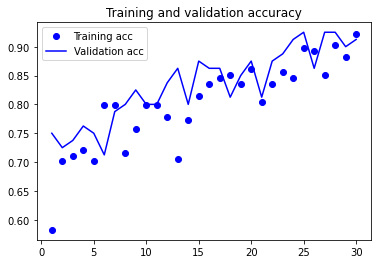

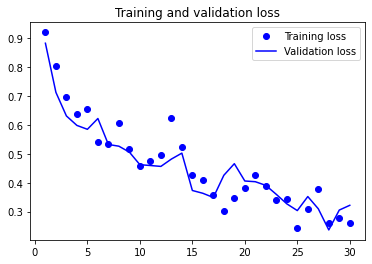

In [109]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

Classes
Let’s clarify now the class number assigned to each of our figures set, since that is how the model will produce it’s predictions:

circles: 0
squares: 1
triangles: 2

Predicting the class of unseen images
With our model trained and stored, we can load a simple unseen image from our test set and see how it is classified:

(28, 28, 3) Images shapes are of 28 pixels by 28 pixels in RGB scale (although they are arguably black and white only)

In [112]:
#pick a random image. 
import numpy as np
from keras.preprocessing import image

In [113]:
test_image = image.load_img('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Test_dataset/Triangles/drawing(73).png', target_size = (28, 28))

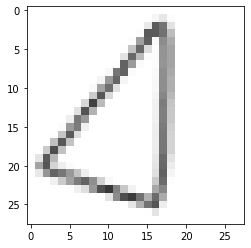

(1, 28, 28, 3)


In [114]:
img_path = 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Test_dataset/Triangles/drawing(73).png'
img = image.load_img(img_path, target_size=(28, 28))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
plt.imshow(img_tensor[0])
plt.show()
print(img_tensor.shape)

Remember CNN requires an input image with 3 dimensions. So we need to add a dimension for the channel, from 2D array to 3D array.

In [117]:
img_tensor.shape

(1, 28, 28, 3)

In [118]:
# predicting images
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
images = np.vstack([x])

In [119]:
images.shape

(1, 28, 28, 3)

Good prediction!

In [120]:
classes = classifier.predict(images)
print("Predicted class is:",classes)

Predicted class is: [[0. 0. 1.]]


In [121]:
test_image = image.img_to_array(test_image)

In [122]:
test_image.shape

(28, 28, 3)

Batch_size specifies how many images we will be sending to the predict method. In our example, we are sending only one image but we still need to specify that.

Final dimension for test_image is (1, 64, 64, 3) it is one because we are sending one image.

In [123]:
test_image = np.expand_dims(test_image, axis = 0)

In [124]:
test_image.shape

(1, 28, 28, 3)

In [125]:
training_set.class_indices

{'Circles': 0, 'squares': 1, 'triangles': 2}

In [76]:
#0 is false and 1 is true. So this is a correct prediction. 
classes = classifier.predict(test_image)
print("Predicted class is:",classes)

Predicted class is: [[0. 0. 1.]]


In [126]:
test_image_2 = image.load_img('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Test_dataset/Circles/drawing(88).png', target_size = (28, 28))

In [127]:
# predicting images
x = image.img_to_array(test_image_2)
x = np.expand_dims(x, axis=0)
images_2 = np.vstack([x])

good prediction. 

In [128]:
images_2.shape

(1, 28, 28, 3)

In [129]:
#0 is false and 1 is true. So this is a correct prediction. 
classes = classifier.predict(images_2)
print("Predicted class is:",classes)

Predicted class is: [[1. 0. 0.]]


In [130]:
test_image_3 = image.load_img('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Test_dataset/Circles/drawing(79).png', target_size = (28, 28))

In [131]:
# predicting images
x = image.img_to_array(test_image_3)
x = np.expand_dims(x, axis=0)
images_3 = np.vstack([x])

good prediction. 

In [132]:
#0 is false and 1 is true. So this is a correct prediction. 
classes = classifier.predict(images_3)
print("Predicted class is:",classes)

Predicted class is: [[1. 0. 0.]]


In [133]:
test_image_4 = image.load_img('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Test_dataset/Squares/drawing(94).png', target_size = (28, 28))

In [134]:
# predicting images
x = image.img_to_array(test_image_4)
x = np.expand_dims(x, axis=0)
images_4 = np.vstack([x])

In [135]:
#0 is false and 1 is true. So this is a correct prediction. 
classes = classifier.predict(images_4)
print("Predicted class is:",classes)

Predicted class is: [[1.0000000e+00 2.9093009e-08 0.0000000e+00]]


# As the warning suggest, please use instead:

np.argmax(model.predict(x), axis=-1), if your model does multi-class classification (e.g. if it uses a softmax last-layer activation).
(model.predict(x) > 0.5).astype("int32"), if your model does binary classification (e.g. if it uses a sigmoid last-layer activation).

Wrong prediction. 

In [136]:
classes = np.argmax(classifier.predict(images_4), axis=1)
print("Predicted class is:",classes)

Predicted class is: [0]


In [137]:
test_image_5 = image.load_img('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/Figures/shapes/Test_dataset/Squares/drawing(76).png', target_size = (28, 28))

In [138]:
# predicting images
x = image.img_to_array(test_image_5)
x = np.expand_dims(x, axis=0)
images_5 = np.vstack([x])

Good prediction!

In [139]:
#0 is false and 1 is true. So this is a correct prediction. 
classes = classifier.predict(images_5)
print("Predicted class is:",classes)

Predicted class is: [[0. 1. 0.]]


In [140]:
training_set.class_indices

{'Circles': 0, 'squares': 1, 'triangles': 2}

Note 1: None in the layer shape indicates the unknown dimension of the batch size (the number of images we will be training in one go). It will be determined on a go when we start the training process.

Step 4: Compiling the Model
To compile our model, we need to define three things:

optimizer
loss function
evaluation metrics

# An optimizer is an algorithm that NN uses to update its weights based on the gradient of the loss function.

The list of possible optimizers is: SGD, RMSprop, Adam, Adadelta, Adagrad, Adamax, Nadam, Ftrl.

Among these, Adam and RMSProp optimizers are probably the most popular.

Tip: To begin with, we can keep all the optimizer parameters at default values except of the learning rate.

# A loss function is a function which compares the predicted values to the ground truth and returns a single number. Usually, the larger the number (loss), the worse our network performs.

Again, here we have several choices. It all depends on the problem at hand.

Three common loss functions and where to use them:

Mean Squared Error is used for regression problems (continuous output).
Categorical cross-entropy is used for classification problems (discrete output) where each output belongs to a single class.
Binary cross-entropy is used also for classification problems but the output is either binary (yes/no, or 1/0) or multi-class classification but the output can belong to several classes at the same time.
In our case, we can use the categorical cross-entropy loss function because we have 10 distinct classes.

# Training our Model

This step is pretty straightforward.

Provide the training data X, and labels Y;
Define a batch size (number of images/input data) to train on simultaneously;
Define a number of epochs, i.e., for how long to train NN;
And whether to shuffle the input data (which is better to do for more general modeling).

# Visualization bonus

# CNN Keras Image Classification

In [164]:
import numpy as np
import pandas as pd 
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import seaborn as sns
import random
from tqdm import tqdm #to create progress bar
import cv2 
import os
print(os.listdir("C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/DataSource"))

['CatVsDogs2nd']


In [165]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define Constants

In [166]:
FAST_RUN = False
IMAGE_WIDTH=150
IMAGE_HEIGHT=150
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS=3 # 3 for Colored Images and 1 for Grayscale Images
BATCH_SIZE=32
EPOCHS= 20

if FAST_RUN:
    EPOCHS= 5 

In [167]:
class_names = ['cats',"dogs"]
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}

In [168]:
class_names_label

{'cats': 0, 'dogs': 1}

Load the data

In [169]:
def load_data():

    datasets = ['C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/DataSource/CatVsDogs2nd/training_set', 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/DataSource/CatVsDogs2nd/test_set']
    output = []

    # Iterate through training and test sets
    for dataset in datasets:

        images = []
        labels = []

        print("Loading {}".format(dataset))

        # Iterate through each folder corresponding to a category
        for folder in os.listdir(dataset):
            label = class_names_label[folder]

            # Iterate through each image in our folder
            for file in tqdm(os.listdir(os.path.join(dataset, folder))):

                # Get the path name of the image
                img_path = os.path.join(os.path.join(dataset, folder), file)
                # Open and resize the img
                image = cv2.imread(img_path,cv2.IMREAD_COLOR)
                
                if image is None: # To account for broken images
                    continue
                #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, IMAGE_SIZE) 
                # Append the image and its corresponding label to the output
                images.append(image)
                labels.append(label)

        images = np.array(images)
        labels = np.array(labels)   

        output.append((images, labels))
    

    return output

In [170]:
(train_images, train_labels), (test_images, test_labels) = load_data()

Loading C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/DataSource/CatVsDogs2nd/training_set


100%|█████████████████████████████████████████████████████████████████████████████| 4006/4006 [00:15<00:00, 263.59it/s]


Loading C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/DataSource/CatVsDogs2nd/test_set


100%|█████████████████████████████████████████████████████████████████████████████| 1013/1013 [00:03<00:00, 289.26it/s]


In [172]:
train_images[0]

array([[[ 40,  44,  39],
        [ 43,  44,  40],
        [ 48,  45,  41],
        ...,
        [160, 178, 178],
        [176, 204, 208],
        [163, 197, 200]],

       [[ 40,  45,  40],
        [ 42,  43,  39],
        [ 46,  43,  39],
        ...,
        [158, 173, 174],
        [168, 194, 199],
        [164, 195, 200]],

       [[ 38,  42,  37],
        [ 37,  38,  34],
        [ 40,  37,  33],
        ...,
        [155, 167, 171],
        [163, 187, 193],
        [168, 197, 204]],

       ...,

       [[ 23,  22,  24],
        [ 20,  19,  21],
        [ 18,  17,  19],
        ...,
        [ 33,  38,  53],
        [ 43,  49,  62],
        [ 23,  29,  40]],

       [[ 29,  28,  30],
        [ 23,  22,  24],
        [ 20,  20,  22],
        ...,
        [ 25,  30,  45],
        [ 20,  26,  39],
        [ 30,  36,  47]],

       [[ 29,  29,  31],
        [ 22,  21,  23],
        [ 19,  18,  20],
        ...,
        [ 27,  34,  49],
        [ 29,  37,  50],
        [ 25,  35,  44]]

In [173]:
#8005 images of size 150*150, color images RGB. 3 channels. 
train_images.shape

(8005, 150, 150, 3)

In [174]:
train_labels

array([0, 0, 0, ..., 1, 1, 1])

In [177]:
train_labels.shape

(8005,)

In [175]:
np.unique(train_labels)

array([0, 1])

The data contains consecutive images of dogs followed by images of cats together. Let us shuffle it

In [176]:
#random state to receive the same data. 
train_images, train_labels = shuffle(train_images, train_labels, random_state=25)

Let us get the length of each dataset, counts across all categories etc.

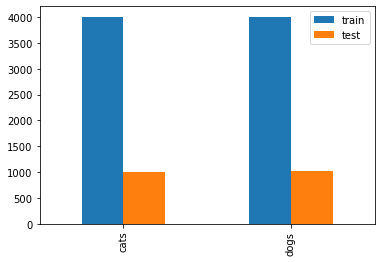

In [178]:
import pandas as pd

_, train_counts = np.unique(train_labels, return_counts=True)
_, test_counts = np.unique(test_labels, return_counts=True)
pd.DataFrame({'train': train_counts,
                    'test': test_counts}, 
             index=class_names
            ).plot.bar()
plt.show()

Plot a random image: 

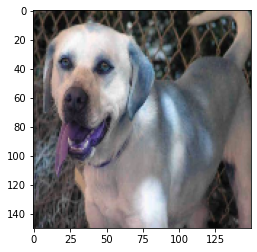

In [179]:
plt.imshow(random.choice(train_images))

Some data-format related changes to make datasets comptabile with Keras
Using the method to_categorical(), train_labels which has categories represented by integers (1 for Dog, 0 for Cat) is converted into a matrix (eg for Dog: [0,1] and for Cat: [1,0]).
Output: This function returns a matrix of binary values (either ‘1’ or ‘0’). It has number of rows equal to the length of the input vector and number of columns equal to the number of classes.

In [180]:
train_labels=to_categorical(train_labels,2)
test_labels=to_categorical(test_labels,2)

In [181]:
train_labels[0:5]

array([[0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.]], dtype=float32)

In [183]:
train_labels.shape

(8005, 2)

In [184]:
train_images.shape

(8005, 150, 150, 3)

train_images is already in Keras accepted format (number_of_images, image width, image height, channels). So we do not need to do reshape it again.
p.s. if number of images is unknown during the reshape operation for number_of_images parameter, put -1 instead.

# Reshaping the data from 1-D to 3-D as required through input by CNN's
#train_images = train_images.reshape(-1,IMAGE_WIDTH,IMAGE_HEIGHT,IMAGE_CHANNELS)
#test_images = test_images.reshape(-1,IMAGE_WIDTH,IMAGE_HEIGHT,IMAGE_CHANNELS)

# Model Training

Layers
In Keras Sequential API, we add one layer at a time, starting from the input layer.

Conv2D: 2D convolution layer. When using this layer as the first layer in a model, provide the keyword argument input_shape, e.g. input_shape=(128, 128, 3) for 128x128 RGB pictures in data_format="channels_last". You can use None when a dimension has variable size.
Other key arguments are filters and kernel_size. filters is the number of desired feature maps. kernel_size is the size of the convolution window. It can be an integer or tuple/list of 2 integers (eg 5 or (5,5) mean the same thing for kernel_size). This layer extracts features from an image (eg ear shape, eyes shape etc in case of a Cat image).
MaxPooling2D: Downsamples the input along its spatial dimensions (height and width) by taking the maximum value over an input window (of size defined by pool_size) for each channel of the input. The window is shifted by strides along each dimension.
Flatten: Flattens the input, that is converts the final feature maps into a one single 1D vector.. Does not affect the batch size.
Dense: Just your regular densely-connected NN layer.
Dropout: This layer is used for Regularization. It randomly sets input units to 0 with a frequency of rate at each step during training time, which helps prevent overfitting.
rate: Float between 0 and 1. Fraction of the input units to drop.
BatchNormalization: Layer that normalizes its inputs. Batch normalization applies a transformation that maintains the mean output close to 0 and the output standard deviation close to 1.

# Activation Functions:

Relu: 'relu' is the rectifier (activation function max(0,x). The rectifier activation function is used to add non linearity to the network. Given a value x, returns max(x, 0). Used ONLY for hidden layers. 

Output layer Activation Functions: Softmax: 2 neurons, probability that the image belongs to one of the two classes. Softmax converts a vector of values to a probability distribution. The elements of the output vector are in range (0, 1) and sum to 1. Softmax is often used as the activation for the last layer of a classification network because the result could be interpreted as a probability distribution. Sigmoid activation function if we have two classes. Softmax used for multiple classes. 

Loss and Optimizer

Binary Cross Entropy computes the cross-entropy loss between true labels and predicted labels. Use this cross-entropy loss for binary (0 or 1) classification applications. Since we have only 2 classes, we used binary_crossentropy
CategoricalCrossentropy: Use this crossentropy loss function when there are two or more label classes. The labels are expected to be provided in a one_hot representation. If you want to provide labels as integers, please use SparseCategoricalCrossentropy loss.
RMSprop: The gist of RMSprop is to: Maintain a moving (discounted) average of the square of gradients, Divide the gradient by the root of this average. For our project, we have used rmsprop optimizer. Feel free to apply adam or other optimizers and see if it improves the performance of the model.
adam: Another popular optimizer is adam. Adam optimization is a stochastic gradient descent method that is based on adaptive estimation of first-order and second-order moments.

# Creating the CNN model: 

In [185]:
model = Sequential()
#32 are the filters. 
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
#model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

#32 filters
model.add(Conv2D(32, (3, 3), activation='relu'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
#64 filters. 
model.add(Conv2D(64, (3, 3), activation='relu'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

#128 filters.
model.add(Conv2D(128, (3, 3), activation='relu'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

#Dense layers after we flatten the data to 1D. 
model.add(Flatten())
model.add(Dense(256, activation='relu'))
#model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(2, activation='softmax')) # 2 because we have cat and dog classes. 

model.compile(loss='binary_crossentropy', optimizer="rmsprop",metrics=['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 72, 72, 32)        9248      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 34, 34, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 17, 17, 64)      

You can use this general formula:

channels_in * kernel_width * kernel_height * channels_out + num_channels

So the first example:

3 * 3 * 3 * 32 + 32 = 896

And the second:

32 * 3 * 3 * 32 + 32 = 9248

the third one: 
    
32 * 3 * 3 * 64 + 64 = 18496. 

# Callbacks

Early Stopping

To prevent over fitting we will stop the learning after val_loss value has not decreased for 10 epochs

In [186]:
earlystop = EarlyStopping(patience=10)

It is better to have a decreasing learning rate during the training to reach efficiently the global minimum of the loss function. To keep the advantage of the fast computation time with a high LR, we will decrease the LR dynamically every X steps (epochs) depending on if it is necessary (when accuracy does not improve).

With the ReduceLROnPlateau function from Keras.callbacks, we will reduce the LR by factor (0.1 in this case) if the accuracy does not improve after 2 epochs.

In [187]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.1, 
                                            min_lr=0.00001)

In [188]:
callbacks = [earlystop, learning_rate_reduction]

# Data Augmentation to Prevent Overfitting

During each Epoch, a random variation of the augmented image is used for training.
Augmentation prevents model from generalising. Instead of learning too much from an image, it learns from an augmented transformation in each epoch

Data Augmentation techniques are applied only to the data we train the model on (train_images), we do not apply it on test dataset (test_images) or validation dataset (in case there are 3 sets).

Training Generator

For Training Images, we will apply following augmentations:

Randomly rotate some training images by 15 degrees
Randomly Zoom by 20% some training images
Horizontally flip images
Randomly shift images horizontally by 10% of the width
Randomly shift images vertically by 10% of the height

In [189]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    width_shift_range=0.1,
    height_shift_range=0.1
)

train_generator= train_datagen.flow(
    train_images, 
    train_labels,
    batch_size= BATCH_SIZE)

In [191]:
train_generator

In [193]:
train_generator[0][0][0]

array([[[0.14601937, 0.1607852 , 0.17164047],
        [0.27201924, 0.28583854, 0.3074433 ],
        [0.49686036, 0.505077  , 0.5286603 ],
        ...,
        [0.19238357, 0.22215845, 0.2288991 ],
        [0.23045397, 0.25902858, 0.26842064],
        [0.27297303, 0.29942304, 0.3116113 ]],

       [[0.13018033, 0.14774072, 0.15233234],
        [0.24163437, 0.25590634, 0.27964538],
        [0.4505091 , 0.4487829 , 0.49972665],
        ...,
        [0.20794551, 0.23293695, 0.2450179 ],
        [0.25331107, 0.27856052, 0.29644835],
        [0.28988612, 0.31341553, 0.33249426]],

       [[0.11481546, 0.1356429 , 0.13416052],
        [0.2087888 , 0.22660755, 0.24266428],
        [0.40322065, 0.39579365, 0.46409312],
        ...,
        [0.24834357, 0.26947823, 0.28141773],
        [0.2900614 , 0.31359082, 0.33319867],
        [0.30727935, 0.33080876, 0.3504166 ]],

       ...,

       [[0.36704382, 0.3827301 , 0.3848166 ],
        [0.36514091, 0.38082722, 0.38227943],
        [0.36323804, 0

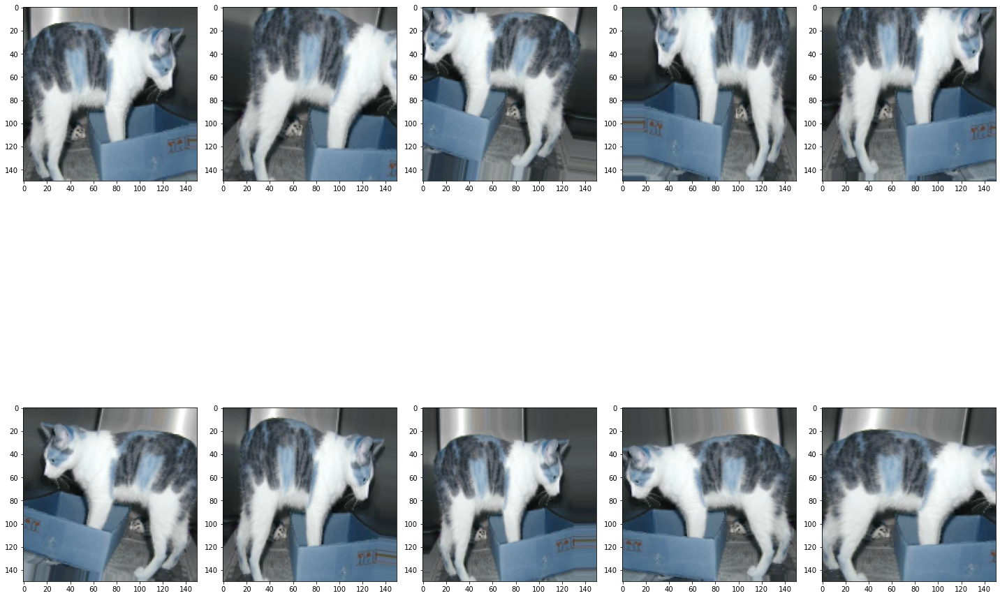

In [194]:
def plotImages(images_arr):
    fig, axes = plt.subplots(2, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()
    

augmented_images = [train_generator[0][0][0] for i in range(10)]
plotImages(augmented_images)

For Validation images, we will only apply Normalization.
Normalization ensures that each input parameter (pixel, in this case) has a similar data distribution. This makes convergence faster while training the network.

In [195]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator= test_datagen.flow(test_images, test_labels,batch_size= BATCH_SIZE)

In [196]:
train_images.shape[0]

8005

In [197]:
steps_per_epoch=train_images.shape[0]/BATCH_SIZE

In [198]:
steps_per_epoch

250.15625

In [199]:
hist = model.fit(train_generator,
    epochs=EPOCHS,
    validation_data= test_generator,
    steps_per_epoch=train_images.shape[0]/BATCH_SIZE,
    callbacks=callbacks 
)

Epoch 1/20
250/250 [==============================] - 138s 548ms/step - loss: 0.6949 - accuracy: 0.5631 - val_loss: 0.6417 - val_accuracy: 0.6347 - lr: 0.0010
Epoch 2/20
250/250 [==============================] - 132s 526ms/step - loss: 0.6404 - accuracy: 0.6325 - val_loss: 0.5855 - val_accuracy: 0.7187 - lr: 0.0010
Epoch 3/20
250/250 [==============================] - 129s 514ms/step - loss: 0.5918 - accuracy: 0.6906 - val_loss: 0.6324 - val_accuracy: 0.6164 - lr: 0.0010
Epoch 4/20
250/250 [==============================] - 131s 525ms/step - loss: 0.5552 - accuracy: 0.7107 - val_loss: 0.4923 - val_accuracy: 0.7687 - lr: 0.0010
Epoch 5/20
250/250 [==============================] - 132s 525ms/step - loss: 0.5235 - accuracy: 0.7433 - val_loss: 0.5648 - val_accuracy: 0.7153 - lr: 0.0010
Epoch 6/20
251/250 [==============================] - ETA: 0s - loss: 0.4993 - accuracy: 0.7579
Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
250/250 [===================

Save the Model

In [200]:
model.save('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/DataSource/CatVsDogs2nd/model.h5')

#Load Model
#model3= keras.models.load_model("../input/model-v3/keras_30.h5")

the below code evaluates whether the model's predictions of the labels of the images coincide with reality or not. 

In [201]:
test_loss = model.evaluate(test_images, test_labels)
test_loss

64/64 [==============================] - 5s 83ms/step - loss: 54.6410 - accuracy: 0.7958


[54.640995025634766, 0.7958477735519409]

In [203]:
train_loss = model.evaluate(train_images, train_labels)
train_loss

251/251 [==============================] - 23s 91ms/step - loss: 51.5356 - accuracy: 0.7945


[51.535621643066406, 0.7945034503936768]

# The first chart is decreasing of the loss function throughout the epochs. 

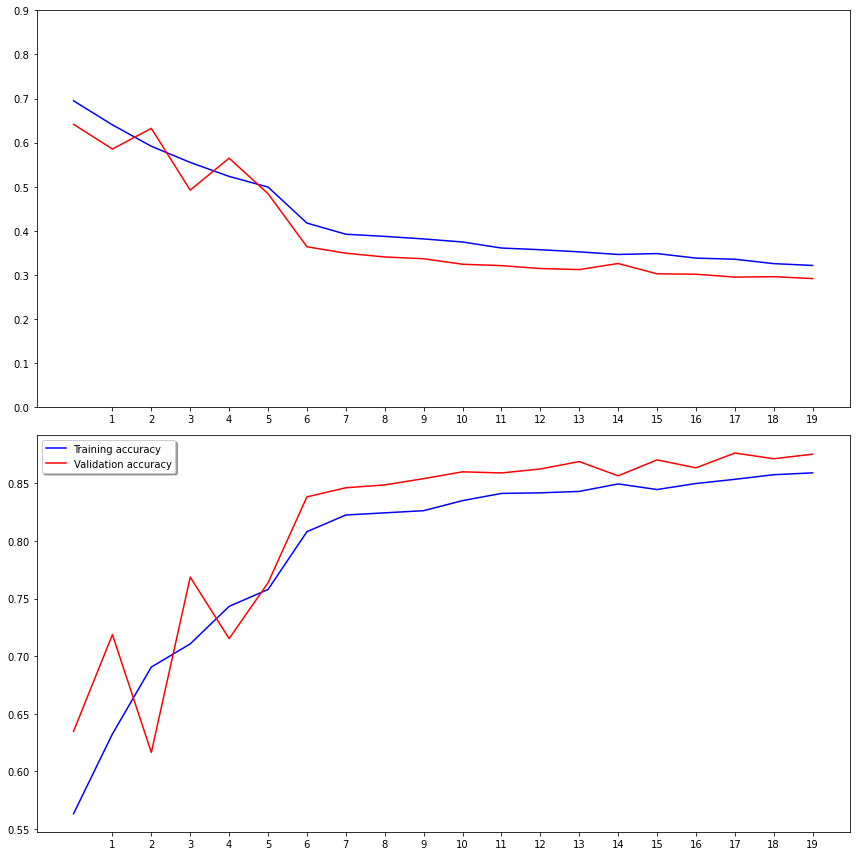

In [202]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
ax1.plot(hist.history['loss'], color='b', label="Training loss")
ax1.plot(hist.history['val_loss'], color='r', label="validation loss")
ax1.set_xticks(np.arange(1, EPOCHS, 1))
ax1.set_yticks(np.arange(0, 1, 0.1))

ax2.plot(hist.history['accuracy'], color='b', label="Training accuracy")
ax2.plot(hist.history['val_accuracy'], color='r',label="Validation accuracy")
ax2.set_xticks(np.arange(1, EPOCHS, 1))

legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

# Making Predictions

In [204]:
predictions = model.predict(test_images)    # Vector of probabilities

In [205]:
predictions

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [1., 0.],
       [0., 1.],
       [0., 1.]], dtype=float32)

In [206]:
pred_labels = np.argmax(predictions, axis = 1) # We take the highest probability
pred_labels

array([1, 1, 1, ..., 0, 1, 1], dtype=int64)

In [207]:
test_labels

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]], dtype=float32)

In [208]:
#Reverse conversion from to_categorical
test_labels_vector = np.argmax(test_labels, axis = 1)

In [209]:
test_labels_vector

array([0, 0, 0, ..., 1, 1, 1], dtype=int64)

In [232]:
unique, counts = np.unique(test_labels_vector, return_counts=True)

In [233]:
print(unique)

[0 1]


In [234]:
#1011 + 1012 = 2023. 
counts

array([1011, 1012], dtype=int64)

In [210]:
pred_labels.shape

(2023,)

In [211]:
test_labels_vector.shape

(2023,)

# Confusion Matrix

In [230]:
class_names

['cats', 'dogs']

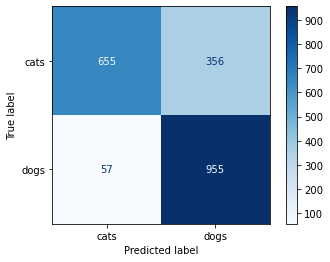

In [212]:
cm = confusion_matrix(test_labels_vector, pred_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.show()

# Classification Report

In [213]:
from sklearn.metrics import classification_report
print(classification_report(test_labels_vector, pred_labels, target_names = class_names))

              precision    recall  f1-score   support

        cats       0.92      0.65      0.76      1011
        dogs       0.73      0.94      0.82      1012

    accuracy                           0.80      2023
   macro avg       0.82      0.80      0.79      2023
weighted avg       0.82      0.80      0.79      2023



# accuracy 80%

In [274]:
def classification_evaluation(classification, predicted_labels, test_labels, test_images):
    if classification== "correct":
        indices_list = np.where(predicted_labels == test_labels)[0]
    else:
        indices_list = np.where(predicted_labels!= test_labels)[0]
    test_images_filtered= [test_images[i] for i in indices_list]
    images_labels_original= [test_labels[i] for i in indices_list]
    images_labels_predicted= [pred_labels[i] for i in indices_list]
    print(f"{len(test_images_filtered)} images were classified {classification.upper()} out of a total of {len(test_images)} in the Test dataset")

    unique, counts = np.unique(images_labels_original, return_counts=True)
    #for i in (0,1):
        #print(f"for category {unique[i]} the number of {classification.upper()} classified images were: {counts[i]}")
        
    # Plot some of the misclassified images
    print("\n\n")
    fig,ax=plt.subplots(5,2)
    fig.suptitle(f"Sample of {classification.upper()} Classified Images", fontsize=20)
    fig.set_size_inches(15,15)
    for i in range(5):
        for j in range (2):
            l=random.randint(0,len(test_images_filtered))
            ax[i,j].imshow(test_images_filtered[l])
            ax[i,j].set_title("Predicted: "+str(images_labels_predicted[l])+"\n"+"Actual: "+str(images_labels_original[l]))
    plt.tight_layout()

In [275]:
class_names_label

{'cats': 0, 'dogs': 1}

From the Confusion Matrix we can see a total of 712 cats images and 1311 dogs  = 2023 it coincides with the pred_labels.shape
and test_labels_vector.shape.

there are 57 missclassified cats out of 655 = %8.7

there are 356 missclassified dogs out of 955 = %37. 

#### classification_evaluation("correct", pred_labels, test_labels_vector, test_images)

# 1610 images were classified CORRECT out of a total of 2023 in the Test dataset = 80% accuracy. 

# Parameters to experiment with for future Runs:

Image size
Batch size
Learning Rate/ Callbacks
Data augmentation options
With and without Normalization
CNN Architecture itself (different combinations of Layers)
Number of Epochs
Compiler Optimizer algorithm

# How Convolution Neural Networks work —with Image Classification Keras Code

In [2]:
import numpy as np
import os
from sklearn.metrics import confusion_matrix

import seaborn as sn; sn.set(font_scale=1.4)
from sklearn.utils import shuffle           
import matplotlib.pyplot as plt             
import cv2                                 
import tensorflow as tf                
from tqdm import tqdm

In [3]:
class_names = ['mountain', 'street', 'glacier', 'buildings', 'sea', 'forest']
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}

nb_classes = len(class_names)

IMAGE_SIZE = (150, 150)

In [4]:
class_names_label

{'mountain': 0,
 'street': 1,
 'glacier': 2,
 'buildings': 3,
 'sea': 4,
 'forest': 5}

In [5]:
def load_data():
    """
    Load the data:
    - 14,034 images to train the network.
    - 3,000 images to evaluate how accurately the network learned to classify images.
    """
    
    datasets =['C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/seg_train/seg_train','C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/seg_test/seg_test']
    output = []
    
    # Iterate through training and test sets
    for dataset in datasets:
        
        images = []
        labels = []
        
        print("Loading {}".format(dataset))
        
        # Iterate through each folder corresponding to a category
        for folder in os.listdir(dataset):
            label = class_names_label[folder]
            
            # Iterate through each image in our folder
            for file in tqdm(os.listdir(os.path.join(dataset, folder))):
                
                # Get the path name of the image
                img_path = os.path.join(os.path.join(dataset, folder), file)
                
                # Open and resize the img
                image = cv2.imread(img_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, IMAGE_SIZE) 
                
                # Append the image and its corresponding label to the output
                images.append(image)
                labels.append(label)
                
        images = np.array(images, dtype = 'float32')
        labels = np.array(labels, dtype = 'int32')   
        
        output.append((images, labels))

    return output

In [6]:
(train_images, train_labels), (test_images, test_labels) = load_data()

Loading C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/seg_train/seg_train


100%|█████████████████████████████████████████████████████████████████████████████| 2382/2382 [00:05<00:00, 466.17it/s]


Loading C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/seg_test/seg_test


100%|███████████████████████████████████████████████████████████████████████████████| 501/501 [00:01<00:00, 484.13it/s]


In [7]:
train_images, train_labels = shuffle(train_images, train_labels, random_state=25)

In [8]:
print(train_images.shape)
print(train_labels.shape)

(14034, 150, 150, 3)
(14034,)


In [9]:
train_labels

array([0, 2, 1, ..., 2, 0, 1])

In [10]:
unique, counts = np.unique(train_labels, return_counts=True)

In [11]:
print(unique)
print(counts)

[0 1 2 3 4 5]
[2512 2382 2404 2191 2274 2271]


In [12]:
class_names_label

{'mountain': 0,
 'street': 1,
 'glacier': 2,
 'buildings': 3,
 'sea': 4,
 'forest': 5}

In [13]:
#How many training and testing examples do we have?
print(train_images.shape)
print(test_images.shape)

(14034, 150, 150, 3)
(3000, 150, 150, 3)


In [14]:
n_train = train_labels.shape[0]
n_test = test_labels.shape[0]

print ("Number of training examples: {}".format(n_train))
print ("Number of testing examples: {}".format(n_test))
print ("Each image is of size: {}".format(IMAGE_SIZE))

Number of training examples: 14034
Number of testing examples: 3000
Each image is of size: (150, 150)


14034 Train samples
3000 Test samples. 

What is the size of the images?
#An RGB image has three channels: red, green, and blue.
150, 150, 3

In [15]:
#What is the proportion of each observed category?
categories_size = {'mountain': 2512,
 'street': 2382,
 'glacier': 2404 ,
 'buildings': 2191 ,
 'sea': 2274,
 'forest': 2271}

In [16]:
categories_size.values()

dict_values([2512, 2382, 2404, 2191, 2274, 2271])

In [17]:
sum(categories_size.values())

14034

In [18]:
s = sum(categories_size.values())
for k, v in categories_size.items():
    pct = v * 100.0 / s
    print(k, pct)

mountain 17.899387202508194
street 16.973065412569476
glacier 17.129827561636027
buildings 15.612084936582585
sea 16.203505771697305
forest 16.18212911500641


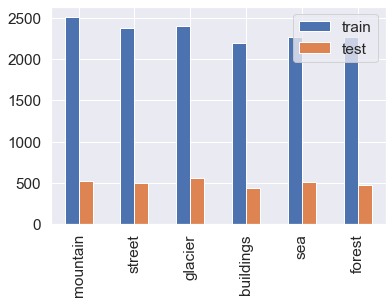

In [19]:
import pandas as pd

_, train_counts = np.unique(train_labels, return_counts=True)
_, test_counts = np.unique(test_labels, return_counts=True)
pd.DataFrame({'train': train_counts,
                    'test': test_counts}, 
             index=class_names
            ).plot.bar()
plt.show()

In [20]:
train_labels_unique, train_labels_counts = np.unique(train_labels, return_counts=True)

In [21]:
train_labels_counts

array([2512, 2382, 2404, 2191, 2274, 2271], dtype=int64)

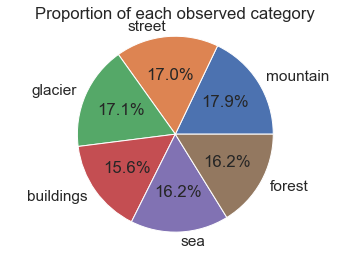

In [22]:
plt.pie(train_counts,
        explode=(0, 0, 0, 0, 0, 0), 
        labels=class_names,
        autopct='%1.1f%%')
plt.axis('equal')
plt.title('Proportion of each observed category')
plt.show()

# Good practice: scale the data

In [23]:
train_images = train_images / 255.0 
test_images = test_images / 255.0

In [24]:
def display_random_image(class_names, images, labels):
    """
        Display a random image from the images array and its correspond label from the labels array.
    """
    
    index = np.random.randint(images.shape[0])
    plt.figure()
    plt.imshow(images[index])
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.title('Image #{} : '.format(index) + class_names[labels[index]])
    plt.show()

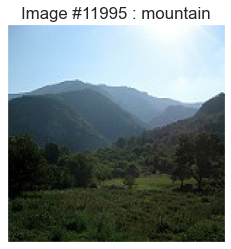

In [25]:
display_random_image(class_names, train_images, train_labels)

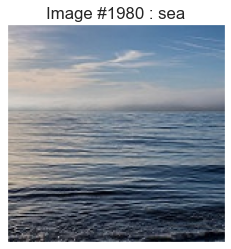

In [26]:
display_random_image(class_names, train_images, train_labels)

We can also display the first 25 images from the training set directly with a loop to get a better view

In [27]:
def display_examples(class_names, images, labels):
    """
        Display 25 images from the images array with its corresponding labels
    """
    
    fig = plt.figure(figsize=(10,10))
    fig.suptitle("Some examples of images of the dataset", fontsize=16)
    for i in range(25):
        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i], cmap=plt.cm.binary)
        plt.xlabel(class_names[labels[i]])
    plt.show()

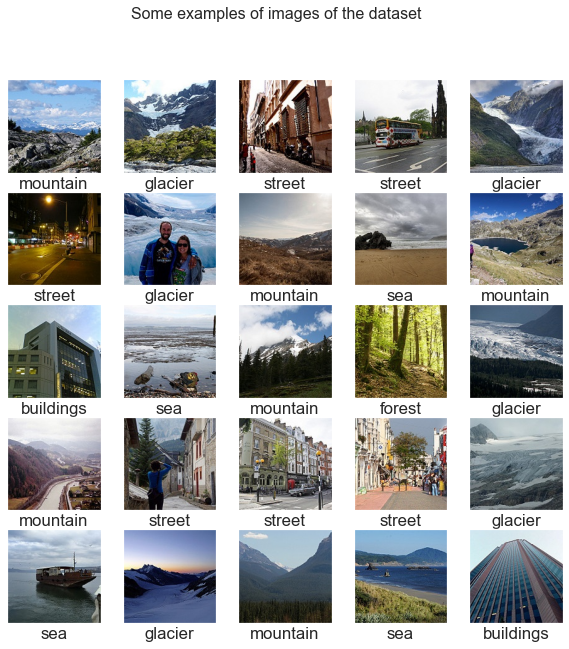

In [28]:
display_examples(class_names, train_images, train_labels)

Beginner: Simple Model Creation
Steps are:

Build the model,
Compile the model,
Train / fit the data to the model,
Evaluate the model on the testing set,
Carry out an error analysis of our model.

We can build an easy model composed of different layers such as:

Conv2D: (32 filters of size 3 by 3) The features will be "extracted" from the image.
MaxPooling2D: The images get half sized.
Flatten: Transforms the format of the images from a 2d-array to a 1d-array of 150 150 3 pixel values.
Relu : given a value x, returns max(x, 0).
Softmax: 6 neurons, probability that the image belongs to one of the classes.

In [29]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (150, 150, 3)), 
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(6, activation=tf.nn.softmax)
])

Then, we can compile it with some parameters such as:

Optimizer: adam = RMSProp + Momentum. What is Momentum and RMSProp ?
Momentum = takes into account past gradient to have a better update.
RMSProp = exponentially weighted average of the squares of past gradients.

# Loss function: we use sparse categorical crossentropy for classification, each images belongs to one class only

# Categorical cross-entropy is used when true labels are one-hot encoded, for example, we have the following true values for 3-class classification problem [1,0,0] , [0,1,0] and [0,0,1]. In sparse categorical cross-entropy , truth labels are integer encoded, for example, [1] , [2] and [3] for 3-class problem.

In [30]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])

hist = model.fit(train_generator,
    epochs=EPOCHS,
    validation_data= test_generator,
    steps_per_epoch=train_images.shape[0]/BATCH_SIZE,
    callbacks=callbacks 
)

if you compare this model compare to the previous one, it uses 20% of the training data to validate the model accuracy while training.

In [31]:
history = model.fit(train_images, train_labels, batch_size=128, epochs=20, validation_split = 0.2)

Epoch 1/20
88/88 [==============================] - 155s 2s/step - loss: 1.2181 - accuracy: 0.5795 - val_loss: 0.8375 - val_accuracy: 0.6893
Epoch 2/20
88/88 [==============================] - 147s 2s/step - loss: 0.7185 - accuracy: 0.7355 - val_loss: 0.6828 - val_accuracy: 0.7517
Epoch 3/20
88/88 [==============================] - 143s 2s/step - loss: 0.5481 - accuracy: 0.8086 - val_loss: 0.6232 - val_accuracy: 0.7795
Epoch 4/20
88/88 [==============================] - 145s 2s/step - loss: 0.4412 - accuracy: 0.8480 - val_loss: 0.6326 - val_accuracy: 0.7731
Epoch 5/20
88/88 [==============================] - 143s 2s/step - loss: 0.3357 - accuracy: 0.8889 - val_loss: 0.6263 - val_accuracy: 0.7820
Epoch 6/20
88/88 [==============================] - 138s 2s/step - loss: 0.2212 - accuracy: 0.9321 - val_loss: 0.6646 - val_accuracy: 0.7848
Epoch 7/20
88/88 [==============================] - 147s 2s/step - loss: 0.1534 - accuracy: 0.9548 - val_loss: 0.7445 - val_accuracy: 0.7756
Epoch 8/20
88

In [32]:
train_images.shape

(14034, 150, 150, 3)

In [36]:
def plot_accuracy_loss(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    fig = plt.figure(figsize=(10,5))

    # Plot accuracy
    plt.subplot(221)
    plt.plot(history.history['accuracy'],'bo--', label = "acc")
    plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
    plt.title("train_acc vs val_acc")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.legend()

    # Plot loss function
    plt.subplot(222)
    plt.plot(history.history['loss'],'bo--', label = "loss")
    plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
    plt.title("train_loss vs val_loss")
    plt.ylabel("loss")
    plt.xlabel("epochs")

    plt.legend()
    plt.show()

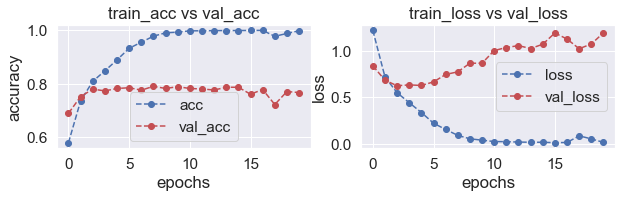

In [37]:
plot_accuracy_loss(history)

In [38]:
test_loss = model.evaluate(test_images, test_labels)

94/94 [==============================] - 7s 70ms/step - loss: 1.1520 - accuracy: 0.7727


We see that we achieve 0.77 accuracy on the testing test. We got a slight underfitting :(

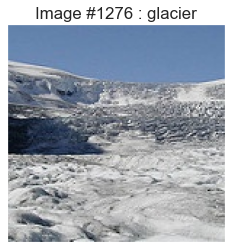

In [39]:
predictions = model.predict(test_images)     # Vector of probabilities
pred_labels = np.argmax(predictions, axis = 1) # We take the highest probability

display_random_image(class_names, test_images, pred_labels)

above we can see a correct prediction. 

In [40]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    """
        Print 25 examples of mislabeled images by the classifier, e.g when test_labels != pred_labels
    """
    BOO = (test_labels == pred_labels)
    mislabeled_indices = np.where(BOO == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]

    title = "Some examples of mislabeled images by the classifier:"
    #this is a previous function that display random images. 
    display_examples(class_names,  mislabeled_images, mislabeled_labels)

"Some examples of mislabeled images by the classifier:"

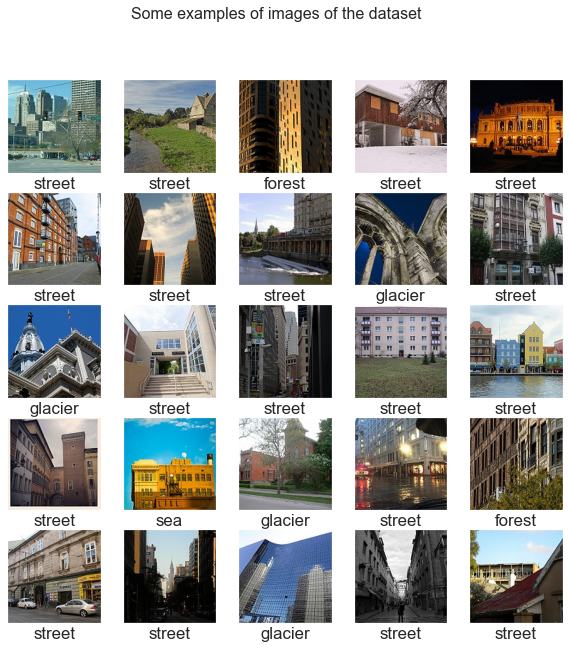

In [41]:
print_mislabeled_images(class_names, test_images, test_labels, pred_labels)

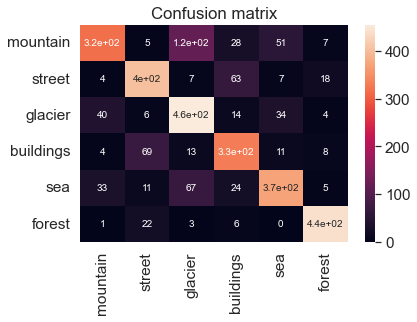

In [42]:
CM = confusion_matrix(test_labels, pred_labels)
ax = plt.axes()
sn.heatmap(CM, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Confusion matrix')
plt.show()

# Conclusion: The classifier has trouble with 2 kinds of images.¶ It has trouble with street and buildings. Well, it can be understandable as as there are buildings in the street. It has also trouble with sea, glacier and moutain as well. It is hard for me to fully distinguish them. However, it can detects forest very accurately!

# Feature extraction with VGG ImageNet

Feature Extraction: Use the representations learned by a previous network to extract meaningful features from new samples. You simply add a new classifier, which will be trained from scratch, on top of the pretrained model so that you can repurpose the feature maps learned previously for the dataset.

In [43]:
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input

model = VGG16(weights='imagenet', include_top=False)

58900480/58889256 [==============================] - 6s 0us/step


Get the features directly from VGG16

In [44]:
train_features = model.predict(train_images)
test_features = model.predict(test_images)

In [47]:
train_images.shape

(14034, 150, 150, 3)

In [48]:
150*150*3#n* of features

67500

In [46]:
print(train_features.shape)
print(test_features.shape)

(14034, 4, 4, 512)
(3000, 4, 4, 512)


In [49]:
4*4*512 #n* of features. 

8192

# Visualize the features through PCA

In [45]:
n_train, x, y, z = train_features.shape
n_test, x, y, z = test_features.shape

In [50]:
numFeatures = x * y * z

In [51]:
numFeatures

8192

In [52]:
from sklearn import decomposition

In [53]:
pca = decomposition.PCA(n_components = 2)

In [54]:
X = train_features.reshape((n_train, x*y*z))

In [55]:
X.shape

(14034, 8192)

In [56]:
pca.fit(X)

PCA(n_components=2)

In [57]:
C = pca.transform(X)

In [59]:
C.shape

(14034, 2)

In [60]:
C1 = C[:,0]
C2 = C[:,1]

In [61]:
class_names

['mountain', 'street', 'glacier', 'buildings', 'sea', 'forest']

In [62]:
train_labels

array([0, 2, 1, ..., 2, 0, 1])

In [64]:
for i, class_name in enumerate(class_names):
    print(i)
    print(class_name)

0
mountain
1
street
2
glacier
3
buildings
4
sea
5
forest


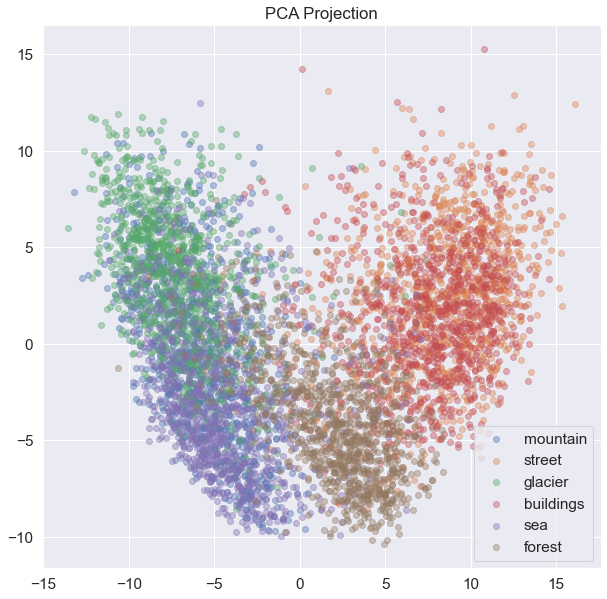

In [65]:
### Figures

plt.subplots(figsize=(10,10))

for i, class_name in enumerate(class_names):
    plt.scatter(C1[train_labels == i][:1000], C2[train_labels == i][:1000], label = class_name, alpha=0.4)
plt.legend()
plt.title("PCA Projection")
plt.show()

We can identifying clusters thanks to this PCA. The clusters correspond more or less to the labels.

We see that glacier and mountain points are very close to each other, as VGG sees them as very similar.

We see that there is no distinction between building and street.

Training on top of VGG
Let's train a simple one-layer Neural Network on the features extracted from VGG.

In [66]:
model2 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (x, y, z)),
    tf.keras.layers.Dense(50, activation=tf.nn.relu),
    tf.keras.layers.Dense(6, activation=tf.nn.softmax)
])

model2.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])

history2 = model2.fit(train_features, train_labels, batch_size=128, epochs=15, validation_split = 0.2)

Epoch 1/15
88/88 [==============================] - 1s 9ms/step - loss: 0.5690 - accuracy: 0.7957 - val_loss: 0.3553 - val_accuracy: 0.8700
Epoch 2/15
88/88 [==============================] - 1s 9ms/step - loss: 0.3135 - accuracy: 0.8885 - val_loss: 0.3224 - val_accuracy: 0.8778
Epoch 3/15
88/88 [==============================] - 1s 10ms/step - loss: 0.2644 - accuracy: 0.9055 - val_loss: 0.3169 - val_accuracy: 0.8803
Epoch 4/15
88/88 [==============================] - 1s 9ms/step - loss: 0.2157 - accuracy: 0.9258 - val_loss: 0.3218 - val_accuracy: 0.8817
Epoch 5/15
88/88 [==============================] - 1s 11ms/step - loss: 0.1813 - accuracy: 0.9392 - val_loss: 0.3192 - val_accuracy: 0.8864
Epoch 6/15
88/88 [==============================] - 1s 8ms/step - loss: 0.1584 - accuracy: 0.9487 - val_loss: 0.3441 - val_accuracy: 0.8757
Epoch 7/15
88/88 [==============================] - 1s 9ms/step - loss: 0.1325 - accuracy: 0.9572 - val_loss: 0.3336 - val_accuracy: 0.8835
Epoch 8/15
88/88 [

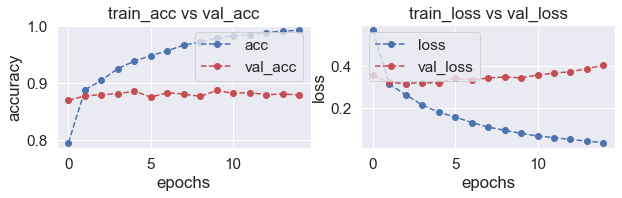

In [67]:
plot_accuracy_loss(history2)

In [68]:
test_loss = model2.evaluate(test_features, test_labels)

94/94 [==============================] - 0s 2ms/step - loss: 0.4213 - accuracy: 0.8757


# With VGG we have imrpvoed the model from 77% to 87%.

# Ensemble Neural Networks

In [69]:
np.random.seed(seed=1997)
# Number of estimators
n_estimators = 10
# Proporition of samples to use to train each training
max_samples = 0.8

max_samples *= n_train
max_samples = int(max_samples)

We define n_estimators Neural Networks.

Each Neural Network will be trained on random subsets of the training dataset. Each subset contains max_samples samples.

In [70]:
models = list()
random = np.random.randint(50, 100, size = n_estimators)

for i in range(n_estimators):
    
    # Model
    model = tf.keras.Sequential([ tf.keras.layers.Flatten(input_shape = (x, y, z)),
                                # One layer with random size
                                    tf.keras.layers.Dense(random[i], activation=tf.nn.relu),
                                    tf.keras.layers.Dense(6, activation=tf.nn.softmax)
                                ])
    
    model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])
    
    # Store model
    models.append(model)

In [71]:
histories = []

for i in range(n_estimators):
    # Train each model on a bag of the training data
    train_idx = np.random.choice(len(train_features), size = max_samples)
    histories.append(models[i].fit(train_features[train_idx], train_labels[train_idx], batch_size=128, epochs=10, validation_split = 0.1))

Epoch 1/10
79/79 [==============================] - 1s 8ms/step - loss: 0.5429 - accuracy: 0.7976 - val_loss: 0.3043 - val_accuracy: 0.8923
Epoch 2/10
79/79 [==============================] - 1s 7ms/step - loss: 0.2578 - accuracy: 0.9109 - val_loss: 0.2391 - val_accuracy: 0.9216
Epoch 3/10
79/79 [==============================] - 1s 7ms/step - loss: 0.1830 - accuracy: 0.9412 - val_loss: 0.2086 - val_accuracy: 0.9225
Epoch 4/10
79/79 [==============================] - 1s 7ms/step - loss: 0.1407 - accuracy: 0.9581 - val_loss: 0.1913 - val_accuracy: 0.9386
Epoch 5/10
79/79 [==============================] - 1s 8ms/step - loss: 0.1077 - accuracy: 0.9691 - val_loss: 0.1841 - val_accuracy: 0.9412
Epoch 6/10
79/79 [==============================] - 1s 7ms/step - loss: 0.0816 - accuracy: 0.9800 - val_loss: 0.1872 - val_accuracy: 0.9430
Epoch 7/10
79/79 [==============================] - 1s 7ms/step - loss: 0.0625 - accuracy: 0.9868 - val_loss: 0.1781 - val_accuracy: 0.9466
Epoch 8/10
79/79 [==

we train 10 epochs with each model using different random subsets of the training dataset. Each subset contains max_samples samples.

We aggregate each model individual predictions to form a final prediction.

In [73]:
models

In [74]:
len(models)

10

In [75]:
predictions = []
for i in range(n_estimators):
    predictions.append(models[i].predict(test_features))

In [80]:
len(predictions)

10

In [82]:
predictions = np.array(predictions)

In [83]:
predictions.shape

(10, 3000, 6)

In [84]:
predictions[0]

array([[3.0805233e-11, 8.3272134e-06, 6.5598374e-07, 9.9999070e-01,
        2.9353470e-07, 1.6517286e-10],
       [8.2020330e-07, 2.3957926e-01, 1.7798789e-05, 7.6030022e-01,
        9.5924319e-05, 6.0476764e-06],
       [1.8163271e-12, 1.4080294e-08, 2.3564206e-10, 9.9999976e-01,
        2.2461967e-07, 1.4363998e-16],
       ...,
       [5.6675959e-02, 4.5755256e-02, 6.5917864e-02, 3.6107126e-04,
        8.2909572e-01, 2.1941965e-03],
       [8.9486645e-07, 6.9571292e-01, 1.2012228e-07, 3.0407000e-01,
        2.1598939e-04, 3.3956958e-08],
       [1.7943680e-10, 9.9990487e-01, 6.2376927e-08, 9.4389798e-05,
        5.9231155e-07, 3.5494420e-08]], dtype=float32)

# 10 different models with their own predictions. 6 features, 3000 samples each. 

In [87]:
#we sum all the predictions to combine them an get better predictions, chossing the maximum value. 
predictions = predictions.sum(axis = 0)

In [88]:
predictions.shape

(3000, 6)

In [89]:
pred_labels = predictions.argmax(axis=1)

In [90]:
pred_labels

array([3, 3, 3, ..., 4, 1, 1], dtype=int64)

In [91]:
pred_labels.shape

(3000,)

# each sample now has the best prediction combined by the 10 models. 

In [92]:
from sklearn.metrics import accuracy_score
print("Accuracy : {}".format(accuracy_score(test_labels, pred_labels)))

Accuracy : 0.888


# With VGG we have improved the model from 77% to 87%. Finally with Ensemble Neural Networks we improve the model to 89%

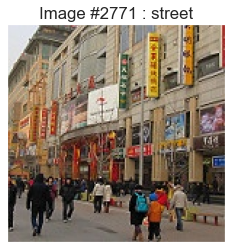

In [94]:
#correct prediction. Combining the 10 models. 
display_random_image(class_names, test_images, pred_labels)

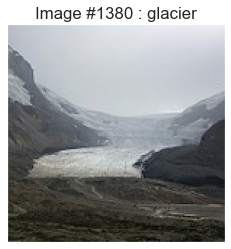

In [95]:
#correct prediction. Combining the 10 models. 
display_random_image(class_names, test_images, pred_labels)

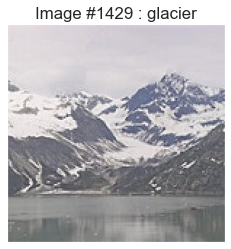

In [97]:
#correct prediction. Combining the 10 models. 
display_random_image(class_names, test_images, pred_labels)

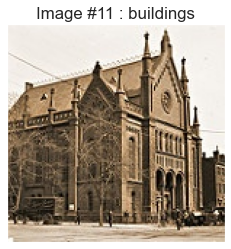

In [98]:
#correct prediction. Combining the 10 models. 
display_random_image(class_names, test_images, pred_labels)

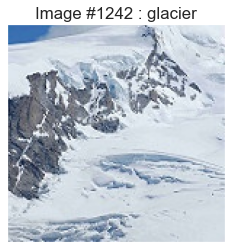

In [99]:
#correct prediction. Combining the 10 models. 
display_random_image(class_names, test_images, pred_labels)

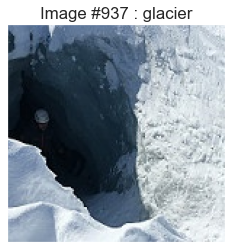

In [100]:
#correct prediction. Combining the 10 models. 
display_random_image(class_names, test_images, pred_labels)

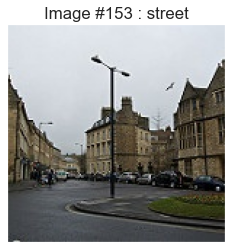

In [101]:
#correct prediction. Combining the 10 models. 
display_random_image(class_names, test_images, pred_labels)

# Convolutional Neural Networks Explained — How To Successfully Classify Images in Python

In [141]:
# Tensorflow / Keras
import tensorflow as tf # used to access argmax function
from tensorflow import keras # for building Neural Networks
print('Tensorflow/Keras: %s' % keras.__version__) # print version
from keras.models import Sequential # for creating a linear stack of layers for our Neural Network
from keras import Input # for instantiating a keras tensor
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout # for adding Concolutional and densely-connected NN layers.

# Data manipulation
import pandas as pd # for data manipulation
print('pandas: %s' % pd.__version__) # print version
import numpy as np # for data manipulation
print('numpy: %s' % np.__version__) # print version

# Sklearn
import sklearn # for model evaluation
print('sklearn: %s' % sklearn.__version__) # print version
from sklearn.model_selection import train_test_split # for splitting the data into train and test samples
from sklearn.metrics import classification_report # for model evaluation metrics
from sklearn.preprocessing import OrdinalEncoder # for encoding labels

# Visualization
import cv2 # for ingesting images
print('OpenCV: %s' % cv2.__version__) # print version
import matplotlib 
import matplotlib.pyplot as plt # for showing images
print('matplotlib: %s' % matplotlib.__version__) # print version

# Other utilities
import sys
import os

Tensorflow/Keras: 2.7.0
pandas: 1.3.4
numpy: 1.22.4
sklearn: 1.2.2
OpenCV: 4.8.0
matplotlib: 3.4.3


In [145]:
BASE_DIR = 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101'

Next, we download and ingest Caltech 101 image data set. Note that we will only use 2 categories (motorbikes and airplanes) in this example as opposed to all 101.

At the same time, we prep the data by resizing and standardising it, encoding labels and splitting it into train and test samples.

In [146]:
# List image categories we are interested in
LABELS = set(["Motorbikes", "airplanes"])

In [147]:
# Create two lists to contain image paths and image labels
ImagePaths=[]
ListLabels=[]
for label in LABELS:
    for image in list(os.listdir(BASE_DIR+"/"+label)):
        ImagePaths=ImagePaths+[BASE_DIR+"/"+label+"/"+image]
        ListLabels=ListLabels+[label]

In [148]:
ImagePaths[0:20]

['C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0001.jpg',
 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0002.jpg',
 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0003.jpg',
 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0004.jpg',
 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0005.jpg',
 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0006.jpg',
 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0007.jpg',
 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0008.jpg',
 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics

In [173]:
import matplotlib.image as mpimg
import numpy

In [174]:
img = mpimg.imread('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0005.jpg')

In [175]:
type(img)

numpy.ndarray

In [176]:
img.shape

(166, 262, 3)

In [149]:
ListLabels

['Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbikes',
 'Motorbik

Total of 1598 images of Motorbikes and Airplanes. 

In [151]:
len(ImagePaths)

1598

In [152]:
import pandas as pd

In [153]:
df = pd.DataFrame(ListLabels, columns=['Transportation'])
df

,Transportation
0,Motorbikes
1,Motorbikes
2,Motorbikes
3,Motorbikes
4,Motorbikes
...,...
1593,airplanes
1594,airplanes
1595,airplanes
1596,airplanes


In [154]:
df.groupby(['Transportation'])['Transportation'].count()

Transportation
Motorbikes    798
airplanes     800
Name: Transportation, dtype: int64

Almost the same number of images per category. Balanaced number of images. 

In [158]:
# Load images and resize to be a fixed 128x128 pixels, ignoring original aspect ratio 166*262 pixels.
data=[]
for img in ImagePaths:
    image = cv2.imread(img)
    image = cv2.resize(image, (128, 128))
    data.append(image)

Pixel value range from 0 to 255. 

In [160]:
# Convert image data to numpy array and standardize values (divide by 255 since RGB values ranges from 0 to 255)
data = np.array(data, dtype="float") / 255.0

In [162]:
#3 channels because we have color images. 
data.shape

(1598, 128, 128, 3)

In [163]:
# Convert Labels list to numpy array
LabelsArray=np.array(ListLabels)

In [164]:
LabelsArray

array(['Motorbikes', 'Motorbikes', 'Motorbikes', ..., 'airplanes',
       'airplanes', 'airplanes'], dtype='<U10')

In [165]:
# Encode labels 
enc = OrdinalEncoder()
y=enc.fit_transform(LabelsArray.reshape(-1,1))

In [166]:
y

array([[0.],
       [0.],
       [0.],
       ...,
       [1.],
       [1.],
       [1.]])

In [167]:
y.shape

(1598, 1)

In [194]:
# ---- Create training and testing samples ---
X_train, X_test, y_train, y_test = train_test_split(data, y, test_size=0.2, random_state=0)
y_train=y_train.reshape(-1,1)
y_test=y_test.reshape(-1,1)

In [195]:
# Print shapes
# Note, model input must have a four-dimensional shape [samples, rows, columns, channels]
print("Shape of X_train: ", X_train.shape)
print("Shape of y_train: ", y_train.shape)
print("Shape of X_test: ", X_test.shape)
print("Shape of y_test: ", y_test.shape)

Shape of X_train:  (1278, 128, 128, 3)
Shape of y_train:  (1278, 1)
Shape of X_test:  (320, 128, 128, 3)
Shape of y_test:  (320, 1)


In [202]:
 y_train

array([[0.],
       [0.],
       [0.],
       ...,
       [1.],
       [0.],
       [0.]])

In [233]:
Transportation, counts = np.unique(y, axis=0, return_counts=True)

In [234]:
Transportation, counts

(array([[0.],
        [1.]]),
 array([798, 800], dtype=int64))

To better understand what data we are working with, let’s display a few input images.

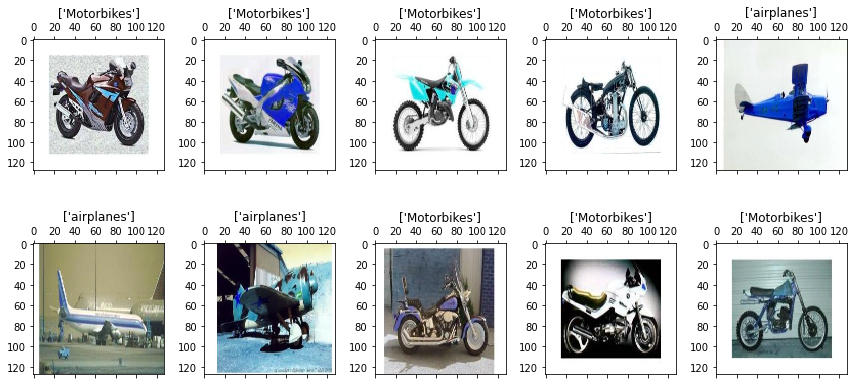

In [170]:
# Display images of 10 animals in the training set and their true labels
fig, axs = plt.subplots(2, 5, sharey=False, tight_layout=True, figsize=(12,6), facecolor='white')
n=0
for i in range(0,2):
    for j in range(0,5):
        axs[i,j].matshow(X_train[n])
        axs[i,j].set(title=enc.inverse_transform(y_train)[n])
        n=n+1
plt.show() 

I have structured the model to have multiple Convolutional, Pooling and Dropout layers to create a “deep” architecture. The initial Convolutional layers help extract low-level features, while later ones identify more high-level features.

So the structure of my DCN model is:

Input layer
The first set of Convolutional, Max Pooling and Dropout layers
The second set of Convolutional, Max Pooling and Dropout layers
The third set of Convolutional, Max Pooling and Dropout layers
Flatten layer
Dense Hidden layer
Output layer

Note that the Dropout layer randomly sets input units to 0 based on the rate we provided (in this case, 0.2). It means that a random 20% of inputs (features/nodes) will be set to zero and will not contribute meaningful weights to the model. The purpose of the Dropout layer is to help prevent overfitting.

Finally, note that I have listed all possible parameters in the first set of Convolutional and Max Pooling layers as I wanted to give you an easy reference to what you can change. However, we keep most of them at default values, so we do not need to explicitly list them every time (see the second and third set of Convolutional and Max Pooling layers).

In [196]:
X_train.shape[0]

1278

In [211]:
##### Step 1 - Specify the structure of a Neural Network
#--- Define a Model
model = Sequential(name="DCN-Model") # Model

In [212]:
#--- Input Layer 
# Specify input shape [rows, columns, channels]
model.add(Input(shape=(X_train.shape[1],X_train.shape[2],X_train.shape[3]), name='Input-Layer')) # Input Layer - need to speicfy the shape of inputs

In [213]:
#16 feature maps or filters of size 3*3.
#--- First Set of Convolution, Max Pooling and Droput Layers (all parameters shown)
model.add(Conv2D(filters=16, # Integer, the dimensionality of the output space (i.e. the number of output filters in the convolution).
                 kernel_size=(3,3), # An integer or tuple/list of 2 integers, specifying the height and width of the 2D convolution window. Can be a single integer to specify the same value for all spatial dimensions.
                 strides=(1,1), # Default=(1,1), An integer or tuple/list of 2 integers, specifying the strides of the convolution along the height and width. Can be a single integer to specify the same value for all spatial dimensions. Specifying any stride value != 1 is incompatible with specifying any dilation_rate value != 1.
                 padding='valid', # Default='valid', "valid" means no padding. "same" results in padding with zeros evenly to the left/right or up/down of the input. When padding="same" and strides=1, the output has the same size as the input.
                 data_format=None, # Default=None, A string, one of channels_last (default) or channels_first. The ordering of the dimensions in the inputs. channels_last corresponds to inputs with shape (batch_size, height, width, channels) while channels_first corresponds to inputs with shape (batch_size, channels,height, width). It defaults to the image_data_format value found in your Keras config file at ~/.keras/keras.json. If you never set it, then it will be channels_last.
                 dilation_rate=(1, 1), # Default=(1, 1), an integer or tuple/list of 2 integers, specifying the dilation rate to use for dilated convolution. Can be a single integer to specify the same value for all spatial dimensions. Currently, specifying any dilation_rate value != 1 is incompatible with specifying any stride value != 1.
                 groups=1, # Default=1, A positive integer specifying the number of groups in which the input is split along the channel axis. Each group is convolved separately with filters / groups filters. The output is the concatenation of all the groups results along the channel axis. Input channels and filters must both be divisible by groups.
                 activation='relu', # Default=None, Activation function to use. If you don't specify anything, no activation is applied (see keras.activations).
                 use_bias=True, # Default=True. 
                 kernel_initializer='glorot_uniform', # Default='glorot_uniform', Initializer for the kernel weights matrix (htsee keras.initializers).
                 bias_initializer='zeros', # Default='zeros', Initializer for the bias vector (see keras.initializers).
                 kernel_regularizer=None, # Default=None, Regularizer function applied to the kernel weights matrix (see keras.regularizers).
                 bias_regularizer=None, # Default=None, Regularizer function applied to the bias vector (see keras.regularizers).
                 activity_regularizer=None, # Default=None, Regularizer function applied to the output of the layer (its "activation") (see keras.regularizers).
                 kernel_constraint=None, # Default=None, Constraint function applied to the kernel matrix (see keras.constraints).
                 bias_constraint=None, # Default=None, Constraint function applied to the bias vector (see keras.constraints).
                 name='2D-Convolutional-Layer-1')
         ) # Convolutional Layer, relu activation used

model.add(MaxPool2D(pool_size=(2,2), # Default=(2,2), integer or tuple of 2 integers, window size over which to take the maximum. (2, 2) will take the max value over a 2x2 pooling window. If only one integer is specified, the same window length will be used for both dimensions.
                    strides=(2,2), # Default=None, Integer, tuple of 2 integers, or None. Strides values. Specifies how far the pooling window moves for each pooling step. If None, it will default to pool_size.
                    padding='valid', # Default='valid', One of "valid" or "same" (case-insensitive). "valid" means no padding. "same" results in padding evenly to the left/right or up/down of the input such that output has the same height/width dimension as the input.
                    data_format=None, # Default=None, A string, one of channels_last (default) or channels_first. The ordering of the dimensions in the inputs. channels_last corresponds to inputs with shape (batch, height, width, channels) while channels_first corresponds to inputs with shape (batch, channels, height, width). 
                    name='2D-MaxPool-Layer-1')
         ) # Max Pooling Layer,

model.add(Dropout(0.2, name='Dropout-Layer-1')) # Dropout Layer


#--- Second Set of Convolution, Max Pooling and Droput Layers 
model.add(Conv2D(filters=64, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu', name='2D-Convolutional-Layer-2nd')) # Convolutional Layer
model.add(MaxPool2D(pool_size=(2,2), strides=(2,2), padding='valid', name='2D-MaxPool-Layer-2')) # Second Max Pooling Layer,
model.add(Dropout(0.2, name='Dropout-Layer-2')) # Dropout Layer


#--- Third Set of Convolution, Max Pooling and Droput Layers
model.add(Conv2D(filters=64, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', name='2D-Convolutional-Layer-3rd')) # Convolutional Layer
model.add(MaxPool2D(pool_size=(2,2), strides=(2,2), padding='same', name='2D-MaxPool-Layer-3')) # Second Max Pooling Layer,
model.add(Dropout(0.2, name='Dropout-Layer-3')) # Dropout Layer


#--- Feed-Forward Densely Connected Layer and Output Layer (note, flattening is required to convert from 2D to 1D shape)
model.add(Flatten(name='Flatten-Layer')) # Flatten the shape so we can feed it into a regular densely connected layer
model.add(Dense(16, activation='relu', name='Hidden-Layer-1', kernel_initializer='HeNormal')) # Hidden Layer, relu(x) = max(x, 0)
#multiclass classification we use the softmax activation. 
model.add(Dense(2, activation='softmax', name='Output-Layer')) # Output Layer, sigmoid (binary classiciation), softmax multiple classes. 

# With the model structure specified, let’s compile it, train it and print the results.

In [214]:
##### Step 2 - Compile keras model
model.compile(optimizer='adam', # default='rmsprop', an algorithm to be used in backpropagation
              loss='SparseCategoricalCrossentropy', # Loss function to be optimized. A string (name of loss function), or a tf.keras.losses.Loss instance.
              metrics=['Accuracy'], # List of metrics to be evaluated by the model during training and testing. Each of this can be a string (name of a built-in function), function or a tf.keras.metrics.Metric instance. 
              loss_weights=None, # default=None, Optional list or dictionary specifying scalar coefficients (Python floats) to weight the loss contributions of different model outputs.
              weighted_metrics=None, # default=None, List of metrics to be evaluated and weighted by sample_weight or class_weight during training and testing.
              run_eagerly=None, # Defaults to False. If True, this Model's logic will not be wrapped in a tf.function. Recommended to leave this as None unless your Model cannot be run inside a tf.function.
              steps_per_execution=None # Defaults to 1. The number of batches to run during each tf.function call. Running multiple batches inside a single tf.function call can greatly improve performance on TPUs or small models with a large Python overhead.
             )

In [215]:
##### Step 3 - Fit keras model on the dataset
history = model.fit(X_train, # input data
                    y_train, # target data
                    batch_size=32, # Number of samples per gradient update. If unspecified, batch_size will default to 32.
                    epochs=20, # default=1, Number of epochs to train the model. An epoch is an iteration over the entire x and y data provided
                    verbose=0, # default='auto', ('auto', 0, 1, or 2). Verbosity mode. 0 = silent, 1 = progress bar, 2 = one line per epoch. 'auto' defaults to 1 for most cases, but 2 when used with ParameterServerStrategy.
                    callbacks=None, # default=None, list of callbacks to apply during training. See tf.keras.callbacks
                    validation_split=0.0, # default=0.0, Fraction of the training data to be used as validation data. The model will set apart this fraction of the training data, will not train on it, and will evaluate the loss and any model metrics on this data at the end of each epoch. 
                    #validation_data=(X_test, y_test), # default=None, Data on which to evaluate the loss and any model metrics at the end of each epoch. 
                    shuffle=True, # default=True, Boolean (whether to shuffle the training data before each epoch) or str (for 'batch').
                    class_weight=None, # default=None, Optional dictionary mapping class indices (integers) to a weight (float) value, used for weighting the loss function (during training only). This can be useful to tell the model to "pay more attention" to samples from an under-represented class.
                    sample_weight=None, # default=None, Optional Numpy array of weights for the training samples, used for weighting the loss function (during training only).
                    initial_epoch=0, # Integer, default=0, Epoch at which to start training (useful for resuming a previous training run).
                    steps_per_epoch=None, # Integer or None, default=None, Total number of steps (batches of samples) before declaring one epoch finished and starting the next epoch. When training with input tensors such as TensorFlow data tensors, the default None is equal to the number of samples in your dataset divided by the batch size, or 1 if that cannot be determined. 
                    validation_steps=None, # Only relevant if validation_data is provided and is a tf.data dataset. Total number of steps (batches of samples) to draw before stopping when performing validation at the end of every epoch.
                    validation_batch_size=None, # Integer or None, default=None, Number of samples per validation batch. If unspecified, will default to batch_size.
                    validation_freq=1, # default=1, Only relevant if validation data is provided. If an integer, specifies how many training epochs to run before a new validation run is performed, e.g. validation_freq=2 runs validation every 2 epochs.
                    max_queue_size=10, # default=10, Used for generator or keras.utils.Sequence input only. Maximum size for the generator queue. If unspecified, max_queue_size will default to 10.
                    workers=1, # default=1, Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
                    use_multiprocessing=False, # default=False, Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False. 
                   )

In [216]:
##### Step 4 - Use model to make predictions
# Note, we need to pass model output through argmax to convert from probability to label
# Also, we convert output from tensor to numpy array
# Predict class labels on training data
pred_labels_tr = np.array(tf.math.argmax(model.predict(X_train),axis=1))
# Predict class labels on a test data
pred_labels_te = np.array(tf.math.argmax(model.predict(X_test),axis=1))

In [217]:
pred_labels_tr.shape, pred_labels_te.shape

((1278,), (320,))

In [218]:
##### Step 5 - Model Performance Summary
print("")
print('------------------------- Model Summary -------------------------')
model.summary() # print model summary
print("")


------------------------- Model Summary -------------------------
Model: "DCN-Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 2D-Convolutional-Layer-1 (C  (None, 126, 126, 16)     448       
 onv2D)                                                          
                                                                 
 2D-MaxPool-Layer-1 (MaxPool  (None, 63, 63, 16)       0         
 ing2D)                                                          
                                                                 
 Dropout-Layer-1 (Dropout)   (None, 63, 63, 16)        0         
                                                                 
 2D-Convolutional-Layer-2nd   (None, 61, 61, 64)       9280      
 (Conv2D)                                                        
                                                                 
 2D-MaxPool-Layer-2 (MaxPool  (None, 30, 30, 64)       0

In [219]:
print("")
print('------------------------- Encoded Names -------------------------')
for i in range(0,len(enc.categories_[0])):
    print(i,": ",enc.categories_[0][i])
print("")


------------------------- Encoded Names -------------------------
0 :  Motorbikes
1 :  airplanes



In [220]:
print('------------------ Evaluation on Training Data ------------------')
# Print the last value in the evaluation metrics contained within history file
for item in history.history:
    print("Final", item, ":", history.history[item][-1])
print("")

------------------ Evaluation on Training Data ------------------
Final loss : 0.12141650170087814
Final Accuracy : 1.0



In [221]:
# Print classification report
print(classification_report(y_train, pred_labels_tr))
print("")

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       640
         1.0       1.00      1.00      1.00       638

    accuracy                           1.00      1278
   macro avg       1.00      1.00      1.00      1278
weighted avg       1.00      1.00      1.00      1278




In [222]:
# print('-------------------- Evaluation on Test Data --------------------')
print(classification_report(y_test, pred_labels_te))
print("")

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       158
         1.0       1.00      1.00      1.00       162

    accuracy                           1.00       320
   macro avg       1.00      1.00      1.00       320
weighted avg       1.00      1.00      1.00       320




# We can see that the model has identified all training and testing images correctly (f1-score of 1!)

# The number of images we have is quite enough to make a perfect model with only a binary classification. 

In [225]:
X_train.shape

(1278, 128, 128, 3)

In [226]:
X_test.shape

(320, 128, 128, 3)

Additional evaluation

Let's take one image an make a prediction to check if the model got it right.

In [ ]:
C:\Users\Admin\Machine Learning chapter 5\Deep Learning basics with Python\caltech-101\airplanes/image_0017

In [ ]:
'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0003.jpg',
 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0004.jpg',

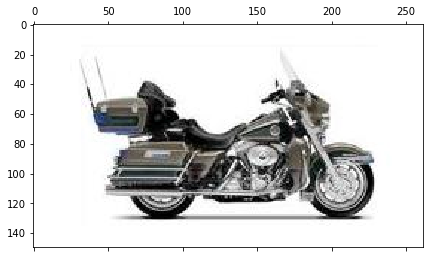

In [235]:
# Read in the image
Motorbike = cv2.imread('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/Motorbikes/image_0004.jpg')

# Display the image
plt.matshow(Motorbike)
plt.show()

Prep the image and use the previously trained DCN model to predict the label.

In [236]:
# Resize 
Motorbike = cv2.resize(Motorbike, (128, 128))

In [237]:
# Standardize (divide by 255 since RGB values ranges from 0 to 255)
Motorbike = Motorbike / 255.0

In [238]:
# The current shape of mydog array is [rows, columns, channels].
# Add extra dimension to make it [samples, rows, columns, channels] that is required by the model
Motorbike = Motorbike[np.newaxis, ...]

In [239]:
# Print shape
print("Shape of the input: ", Motorbike.shape)
print("")

Shape of the input:  (1, 128, 128, 3)



Good Prediction!

In [240]:
#----- Predict label of mydog image -----
# Note, we need to pass model output through argmax to convert from probability to label
# Also, we convert output from tensor to numpy array
# Finally, we do inverse transform to convert from encoded value to categorical label
pred_Motorbike = enc.inverse_transform(np.array(tf.math.argmax(model.predict(Motorbike),axis=1)).reshape(-1, 1))
print("DCN model prediction: ", pred_Motorbike)

DCN model prediction:  [['Motorbikes']]


In [241]:
#----- Show Probabilities of each prediction -----
pred_probs=model.predict(Motorbike)

In [242]:
pred_probs

array([[1.0000000e+00, 1.3615593e-10]], dtype=float32)

In [243]:
# Print in a nice format with label and probability next to each other
print("")
print("Probabilities for each category:")
for i in range(0,len(enc.categories_[0])):
    print(enc.categories_[0][i], " : ", pred_probs[0][i])


Probabilities for each category:
Motorbikes  :  1.0
airplanes  :  1.3615593e-10


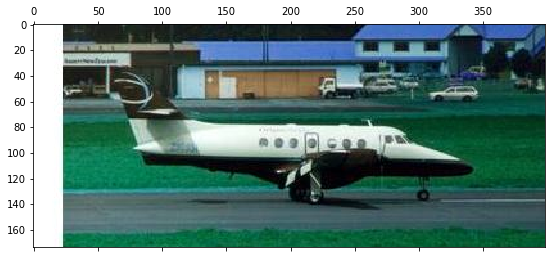

In [244]:
# Read in the image
airplane = cv2.imread('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/caltech-101/airplanes/image_0017.jpg')
# Display the image
plt.matshow(airplane)
plt.show()

In [246]:
# Resize 
airplane = cv2.resize(airplane, (128, 128))

In [247]:
# Standardize (divide by 255 since RGB values ranges from 0 to 255)
airplane = airplane / 255.0

In [248]:
# The current shape of mydog array is [rows, columns, channels].
# Add extra dimension to make it [samples, rows, columns, channels] that is required by the model
airplane = airplane[np.newaxis, ...]

In [249]:
# Print shape
print("Shape of the input: ", airplane.shape)
print("")

Shape of the input:  (1, 128, 128, 3)



# Good prediction! The model is predicting an Airplane by a probability of 0.78

In [251]:
#----- Predict label of mydog image -----
# Note, we need to pass model output through argmax to convert from probability to label
# Also, we convert output from tensor to numpy array
# Finally, we do inverse transform to convert from encoded value to categorical label
pred_airplane = enc.inverse_transform(np.array(tf.math.argmax(model.predict(airplane),axis=1)).reshape(-1, 1))
print("DCN model prediction: ", pred_airplane)

DCN model prediction:  [['airplanes']]


In [252]:
#----- Show Probabilities of each prediction -----
pred_probs=model.predict(airplane)

In [253]:
# Print in a nice format with label and probability next to each other
print("")
print("Probabilities for each category:")
for i in range(0,len(enc.categories_[0])):
    print(enc.categories_[0][i], " : ", pred_probs[0][i])


Probabilities for each category:
Motorbikes  :  0.21102864
airplanes  :  0.78897136


-----------------------------------------------------------------------------------------------------------------------------

In [254]:
import numpy as np 
import pandas as pd
from sklearn.model_selection import train_test_split
import cv2
import sklearn
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Flatten, BatchNormalization, Dropout, Input
from tensorflow.keras.layers import Rescaling
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom
from keras import callbacks
from keras.layers import Dense, Flatten, BatchNormalization, GlobalAveragePooling2D, Dropout, Input
from keras import Model
from keras.layers import  Conv2D, MaxPool2D, add
from keras.preprocessing import image
import random
import os

In [255]:
training_path = 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/training_set'
test_path = 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/test_set'
IMAGE_SIZE = (150, 150)
BATCH_SIZE = 150

In [256]:
train_ds = keras.utils.image_dataset_from_directory(
    directory= 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/training_set',
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42,
    validation_split=0.15,
    subset='training'
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    directory= 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/test_set',
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

valid_ds = tf.keras.utils.image_dataset_from_directory(
    directory= 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/training_set',
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42,
    validation_split=0.15,
    subset='validation'
)

Found 8005 files belonging to 2 classes.
Using 6805 files for training.
Found 2023 files belonging to 2 classes.
Found 8005 files belonging to 2 classes.
Using 1200 files for validation.


# EDA

Let's see what this data is:

In [257]:
cnt_imgs = 16  # we take 8 images for each class
cat_path = training_path + '/cats'
dog_path = training_path + '/dogs'
cat_imgs = os.listdir(cat_path)[:cnt_imgs]
dog_imgs = os.listdir(dog_path)[:cnt_imgs]

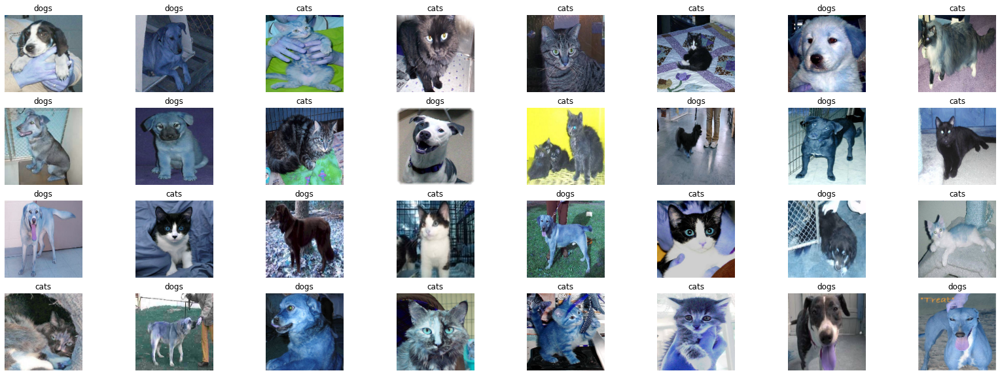

In [258]:
counter = 0
cat_imgs_path = [cat_path + '/' + i for i in cat_imgs]
dog_imgs_path = [dog_path + '/' + j for j in dog_imgs]
all_imgs = cat_imgs_path + dog_imgs_path
random.shuffle(all_imgs)

plt.figure(figsize=(28, 10))
for img_path in all_imgs:
    plt.subplot(4, 8, counter + 1)
    img = cv2.imread(img_path)
    img = cv2.resize(img, IMAGE_SIZE)
    label = img_path[len(training_path) + 1: img_path.rfind('/')]
    plt.imshow(img)
    plt.title(label)
    plt.axis('off')
    counter += 1

Let's also see if there is an imbalance of classes:

In [259]:
def check_cnt_label(label: str) -> int:
    """A function that should determine the number of objects of this
    class in the specified directories"""
    cnt_object = 0
    paths = [training_path, test_path]
    for path in paths:
        path += '/' + label
        cnt_object += len(os.listdir(path))
    return cnt_object

CNT_CAT = check_cnt_label('cats')
CNT_DOG = check_cnt_label('dogs')

In [260]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=['Cats', 'Dogs'],
    y=[CNT_CAT, CNT_DOG],
    width=[0.4, 0.4]))

fig.update_layout(title='Classes and their number in the dataset', title_x=0.5)

Cats: 5013
Dogs: 5019

What can we see from this graph:

There is no class imbalance, so the Accuracy metric is objective
There are 10,000 objects on train, valid, test in total

# Data Preprocessing:

It is necessary to scale the data, because the neural network must accept numbers in the range from 0 to 1 as input. Changing the image size to the standard value (200, 200) was carried out already at the stage of creating generators.

In [336]:
rescale = Rescaling(scale=1.0 / 255)

train_ds = train_ds.map(lambda image, label: (rescale(image), label))

valid_ds  = valid_ds.map(lambda image, label: (rescale(image), label))

test_ds = test_ds.map(lambda image, label: (rescale(image), label))

# Creating the CNN Model: 

To reduce overfitting, we will use the following methods:

Change the number of epochs
Use callback
Change the complexity of the model
Use Dropout layers in the model

In [337]:
# We will also set the number of epochs:
EPOCHS = 35

In [338]:
CALLBACKS = [
    callbacks.EarlyStopping(monitor='loss', min_delta=0.01, patience=7, verbose=1),  
    callbacks.ReduceLROnPlateau(monitor='loss', factor=0.1, min_delta=0.01, min_lr=1e-10, patience=2, verbose=1, mode='auto')
]

In [339]:
IMAGE_SIZE

(150, 150)

GlobalAveragePooling2D() is another function in Keras that reduces the spatial dimensions of a tensor. Unlike Flatten() , which simply reshapes the data, GlobalAveragePooling2D() performs an operation on the data. It is like flattening the data. 

In [340]:
inputs = Input(shape=(IMAGE_SIZE + (3,)))

x = Conv2D(32, (3, 3), activation='elu')(inputs)
x = BatchNormalization()(x)
x = Conv2D(64, (3, 3), activation='elu')(x)
block_1_output = MaxPool2D(pool_size=(3, 3))(x)

x = Conv2D(64, (3, 3), activation='elu', padding='same')(block_1_output)
x = BatchNormalization()(x)
x = Conv2D(64, (3, 3), activation='elu', padding='same')(x)
block_2_output = add([x, block_1_output])

x = Conv2D(64, (3, 3), activation='elu', padding='same')(block_2_output)
x = BatchNormalization()(x)
x = Conv2D(64, (3, 3), activation='elu', padding='same')(x)
block_3_output = add([x, block_2_output])

x = Conv2D(128, (3, 3), activation='elu')(block_3_output)
x = MaxPool2D(pool_size=(2, 2))(x)
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='elu')(x)
output = Dense(1, activation='sigmoid')(x)

In [341]:
model = Model(inputs, output)

In [342]:
model.compile(metrics=['Accuracy'], loss='binary_crossentropy', optimizer='Adam')

In [343]:
history = model.fit(train_ds, epochs=EPOCHS, validation_data=valid_ds, callbacks=CALLBACKS)

Epoch 1/35
46/46 [==============================] - 527s 11s/step - loss: 0.6719 - Accuracy: 0.5860 - val_loss: 0.6927 - val_Accuracy: 0.5083 - lr: 0.0010
Epoch 2/35
46/46 [==============================] - 443s 10s/step - loss: 0.6529 - Accuracy: 0.6026 - val_loss: 0.6937 - val_Accuracy: 0.4917 - lr: 0.0010
Epoch 3/35
46/46 [==============================] - 518s 11s/step - loss: 0.6428 - Accuracy: 0.6073 - val_loss: 0.7173 - val_Accuracy: 0.4917 - lr: 0.0010
Epoch 4/35
46/46 [==============================] - 558s 12s/step - loss: 0.6328 - Accuracy: 0.6323 - val_loss: 0.8044 - val_Accuracy: 0.4917 - lr: 0.0010
Epoch 5/35
46/46 [==============================] - 521s 11s/step - loss: 0.5903 - Accuracy: 0.6796 - val_loss: 1.0078 - val_Accuracy: 0.4917 - lr: 0.0010
Epoch 6/35
46/46 [==============================] - 535s 12s/step - loss: 0.5772 - Accuracy: 0.6902 - val_loss: 1.4514 - val_Accuracy: 0.4917 - lr: 0.0010
Epoch 7/35
46/46 [==============================] - 535s 12s/step - lo

In [345]:
test_result = model.evaluate(test_ds, verbose=0)[1]
train_result = model.evaluate(train_ds, verbose=0)[1]
print(f'Metric on test: {test_result}')
print(f'Metric on train: {train_result}')

Metric on test: 0.5027187466621399
Metric on train: 0.5012490749359131


In [1]:
%matplotlib inline

#ignore all warning informations
import warnings 
warnings.filterwarnings('ignore') 

import matplotlib.pyplot as plt
import matplotlib.image as mpimage
import tensorflow as tf
import numpy as np
import pandas as pd
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow import keras
from tensorflow.keras.models import load_model

In [2]:
train_dir= 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/training_set'
test_dir='C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/test_set'

In [3]:
train_cat_dir=train_dir + "/" +'cats'
train_dog_dir=train_dir + "/" + 'dogs'

In [4]:
train_cat_fnames=os.listdir(train_cat_dir)
train_dog_fnames=os.listdir(train_dog_dir)

In [5]:
nrows=4
ncols=4
pic_index=0

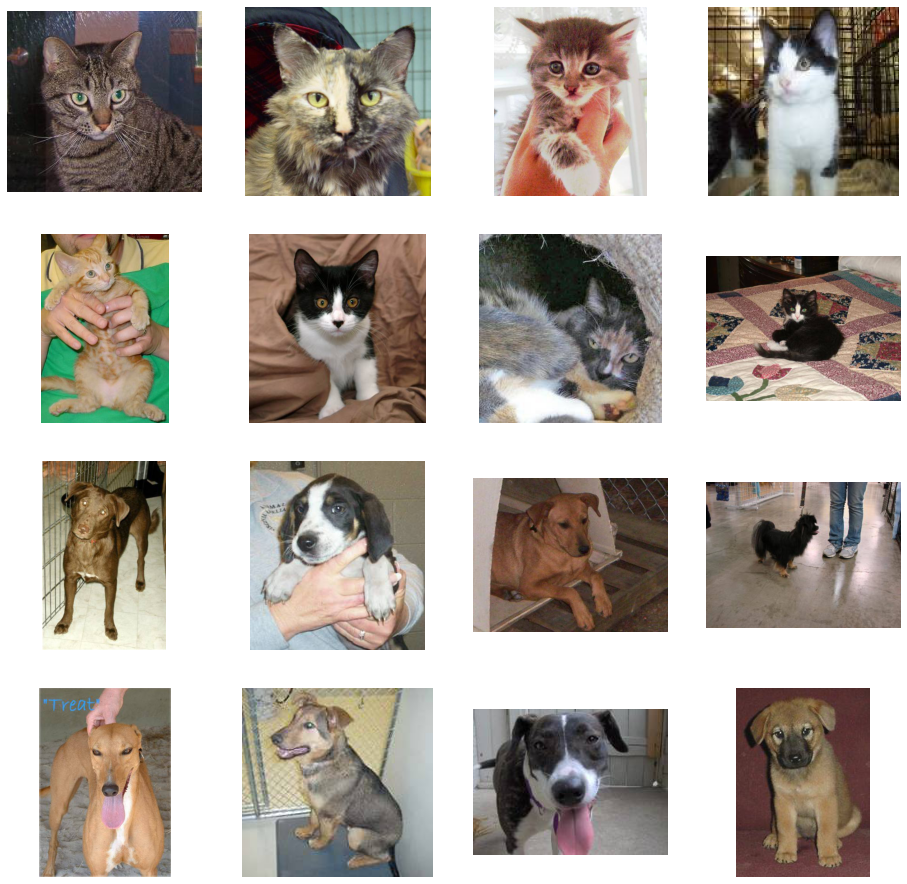

In [6]:
#visualize some samples. 
fig=plt.gcf()
fig.set_size_inches(nrows*4,ncols*4)

pic_index+=8

next_cat_pix=[os.path.join(train_cat_dir,fname) for fname in train_cat_fnames[pic_index-8:pic_index]]
next_dog_pix=[os.path.join(train_dog_dir,fname) for fname in train_dog_fnames[pic_index-8:pic_index]]

for i,img_path in enumerate(next_cat_pix+next_dog_pix):
    sp=plt.subplot(nrows,ncols,i+1)
    sp.axis('off')
    
    img=mpimage.imread(img_path)
    plt.imshow(img)

We use ImageDataGenerator to do data argumentation,please note we only apply argumentation to training data, and only rescalling with testing(validation) data

In [7]:
train_datagen=ImageDataGenerator(rescale=1.0/255.0,#rescaling factor
                                rotation_range=45, #Int. Degree range for random rotations.
                                width_shift_range=0.2, #fraction of total width
                                height_shift_range=0.2,#fraction of total height
                                shear_range=0.2, #Float. Shear Intensity (Shear angle in counter-clockwise direction in degrees)
                                zoom_range=0.2,#Float or [lower, upper]. Range for random zoom
                                horizontal_flip=True,#Boolean. Randomly flip inputs horizontally.
                                fill_mode='nearest' #Points outside the boundaries of the input are filled according to the given mode
                                )

test_datagen=ImageDataGenerator(rescale=1.0/255.0)

#ImageDataGenarator will generate dataset, as well as generate training labels based on the path,for example,
#our training directory is ../input/cat-and-dog/training_set/training_set/, there are two directory under it, cats and dogs,
#then the generator will generate data with label 'cats' and 'dogs', and with all pictures under each directory respectively
train_generator=train_datagen.flow_from_directory(train_dir,
                                                target_size=(150,150),
                                                batch_size=20,
                                                class_mode='binary')

test_generator=test_datagen.flow_from_directory(test_dir,
                                                target_size=(150,150),
                                                batch_size=20,
                                                class_mode='binary')

Found 8005 images belonging to 2 classes.
Found 2023 images belonging to 2 classes.


We will use three CNN with three Maxpooling layers first, then get it flattened,then one fully connected layer with 512 neurons.
for input layer and all hidden layers, we will use relu as activation function. In the output layer, we will use sigmoid to activate it.

In [8]:
model=tf.keras.models.Sequential([
    keras.layers.Conv2D(32,(3,3),input_shape=(150,150,3),activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    keras.layers.Conv2D(64,(3,3),activation="relu"),
    keras.layers.MaxPooling2D(2,2),
    keras.layers.Conv2D(128,(3,3),activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    keras.layers.Conv2D(128,(3,3),activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    
    keras.layers.Flatten(),
    keras.layers.Dense(512,activation='relu'),
    keras.layers.Dense(1,activation='sigmoid')    
])

In [9]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

In [10]:
model.compile(loss='binary_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])

In [11]:
history=model.fit_generator(train_generator,
                  epochs=300,
                  steps_per_epoch=100,
                  validation_data=test_generator,
                  validation_steps=50,
                  verbose=1
                 )

Epoch 1/300
100/100 [==============================] - 47s 467ms/step - loss: 0.7002 - accuracy: 0.5254 - val_loss: 0.6866 - val_accuracy: 0.5450
Epoch 2/300
100/100 [==============================] - 49s 491ms/step - loss: 0.6890 - accuracy: 0.5285 - val_loss: 0.6725 - val_accuracy: 0.5630
Epoch 3/300
100/100 [==============================] - 49s 486ms/step - loss: 0.6938 - accuracy: 0.5209 - val_loss: 0.6900 - val_accuracy: 0.5340
Epoch 4/300
100/100 [==============================] - 50s 503ms/step - loss: 0.6897 - accuracy: 0.5305 - val_loss: 0.6931 - val_accuracy: 0.4980
Epoch 5/300
100/100 [==============================] - 49s 488ms/step - loss: 0.6920 - accuracy: 0.5350 - val_loss: 0.6885 - val_accuracy: 0.5270
Epoch 6/300
100/100 [==============================] - 50s 501ms/step - loss: 0.6908 - accuracy: 0.5400 - val_loss: 0.7009 - val_accuracy: 0.5000
Epoch 7/300
100/100 [==============================] - 51s 514ms/step - loss: 0.6843 - accuracy: 0.5525 - val_loss: 0.6855 -

Epoch 57/300
100/100 [==============================] - 41s 408ms/step - loss: 0.5129 - accuracy: 0.7430 - val_loss: 0.4713 - val_accuracy: 0.7840
Epoch 58/300
100/100 [==============================] - 41s 406ms/step - loss: 0.5039 - accuracy: 0.7580 - val_loss: 0.4667 - val_accuracy: 0.7630
Epoch 59/300
100/100 [==============================] - 43s 430ms/step - loss: 0.5090 - accuracy: 0.7490 - val_loss: 0.4485 - val_accuracy: 0.7880
Epoch 60/300
100/100 [==============================] - 41s 412ms/step - loss: 0.4991 - accuracy: 0.7515 - val_loss: 0.4541 - val_accuracy: 0.7860
Epoch 61/300
100/100 [==============================] - 41s 409ms/step - loss: 0.4721 - accuracy: 0.7780 - val_loss: 0.4363 - val_accuracy: 0.7910
Epoch 62/300
100/100 [==============================] - 41s 410ms/step - loss: 0.5019 - accuracy: 0.7602 - val_loss: 0.4342 - val_accuracy: 0.8040
Epoch 63/300
100/100 [==============================] - 41s 413ms/step - loss: 0.4829 - accuracy: 0.7760 - val_loss: 0

100/100 [==============================] - 47s 474ms/step - loss: 0.3039 - accuracy: 0.8705 - val_loss: 0.3107 - val_accuracy: 0.8710
Epoch 168/300
100/100 [==============================] - 50s 503ms/step - loss: 0.3178 - accuracy: 0.8555 - val_loss: 0.2712 - val_accuracy: 0.8770
Epoch 169/300
100/100 [==============================] - 48s 475ms/step - loss: 0.2854 - accuracy: 0.8815 - val_loss: 0.2766 - val_accuracy: 0.8850
Epoch 170/300
100/100 [==============================] - 46s 458ms/step - loss: 0.3474 - accuracy: 0.8450 - val_loss: 0.2676 - val_accuracy: 0.8960
Epoch 171/300
100/100 [==============================] - 45s 450ms/step - loss: 0.3038 - accuracy: 0.8675 - val_loss: 0.3181 - val_accuracy: 0.8660
Epoch 172/300
100/100 [==============================] - 46s 456ms/step - loss: 0.3009 - accuracy: 0.8715 - val_loss: 0.2635 - val_accuracy: 0.8890
Epoch 173/300
100/100 [==============================] - 45s 453ms/step - loss: 0.2997 - accuracy: 0.8685 - val_loss: 0.2770 -

100/100 [==============================] - 45s 452ms/step - loss: 0.2325 - accuracy: 0.9030 - val_loss: 0.2278 - val_accuracy: 0.9090
Epoch 278/300
100/100 [==============================] - 44s 442ms/step - loss: 0.2556 - accuracy: 0.8855 - val_loss: 0.1869 - val_accuracy: 0.9270
Epoch 279/300
100/100 [==============================] - 45s 449ms/step - loss: 0.2278 - accuracy: 0.9020 - val_loss: 0.1864 - val_accuracy: 0.9340
Epoch 280/300
100/100 [==============================] - 46s 462ms/step - loss: 0.2410 - accuracy: 0.9000 - val_loss: 0.2153 - val_accuracy: 0.9020
Epoch 281/300
100/100 [==============================] - 45s 451ms/step - loss: 0.2224 - accuracy: 0.9045 - val_loss: 0.2048 - val_accuracy: 0.9170
Epoch 282/300
100/100 [==============================] - 48s 475ms/step - loss: 0.2299 - accuracy: 0.9015 - val_loss: 0.2302 - val_accuracy: 0.9080
Epoch 283/300
100/100 [==============================] - 46s 462ms/step - loss: 0.2476 - accuracy: 0.8910 - val_loss: 0.2780 -

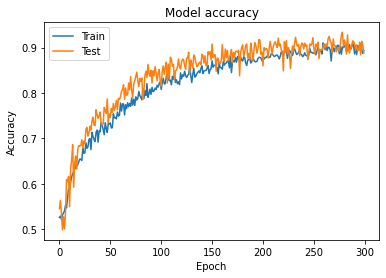

In [16]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

In [18]:
#Save model to a file
model.save('C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/cat-dogs-model.h5') 

In [21]:
class_names = ['cats',"dogs"]
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}

In [22]:
class_names_label

{'cats': 0, 'dogs': 1}

In [19]:
def load_data():

    datasets = ['C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/training_set', 'C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/test_set']
    output = []

    # Iterate through training and test sets
    for dataset in datasets:

        images = []
        labels = []

        print("Loading {}".format(dataset))

        # Iterate through each folder corresponding to a category
        for folder in os.listdir(dataset):
            label = class_names_label[folder]

            # Iterate through each image in our folder
            for file in tqdm(os.listdir(os.path.join(dataset, folder))):

                # Get the path name of the image
                img_path = os.path.join(os.path.join(dataset, folder), file)
                # Open and resize the img
                image = cv2.imread(img_path,cv2.IMREAD_COLOR)
                
                if image is None: # To account for broken images
                    continue
                #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, IMAGE_SIZE) 
                # Append the image and its corresponding label to the output
                images.append(image)
                labels.append(label)

        images = np.array(images)
        labels = np.array(labels)   

        output.append((images, labels))
    

    return output

In [26]:
import numpy as np
import pandas as pd 
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import seaborn as sns
import random
from tqdm import tqdm #to create progress bar
import cv2 

In [28]:
IMAGE_WIDTH=150
IMAGE_HEIGHT=150
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)

In [29]:
(train_images, train_labels), (test_images, test_labels) = load_data()

Loading C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/training_set


100%|█████████████████████████████████████████████████████████████████████████████| 4006/4006 [00:07<00:00, 521.80it/s]


Loading C:/Users/Admin/Machine Learning chapter 5/Deep Learning basics with Python/CatVsDogs2/test_set


100%|█████████████████████████████████████████████████████████████████████████████| 1013/1013 [00:01<00:00, 590.87it/s]


In [30]:
train_images.shape

(8005, 150, 150, 3)

In [31]:
train_labels

array([0, 0, 0, ..., 1, 1, 1])

In [32]:
labels_unique, labels_counts = np.unique(train_labels, return_counts=True)

In [33]:
print(labels_unique)
print(labels_counts)

[0 1]
[4000 4005]


In [34]:
test_images.shape

(2023, 150, 150, 3)

# Making Predictions

In [35]:
predictions = model.predict(test_images)

In [36]:
predictions

array([[1.],
       [1.],
       [0.],
       ...,
       [1.],
       [1.],
       [1.]], dtype=float32)

In [38]:
predictions.shape

(2023, 1)

In [44]:
predictions = predictions.reshape(-1)

In [59]:
predictions

array([1., 1., 0., ..., 1., 1., 1.], dtype=float32)

In [61]:
def func(x):
    x = np.where(x>0.5,1,0)
    return x

In [63]:
predictions = func(predictions)

In [80]:
predictions

array([1, 1, 0, ..., 1, 1, 1])

In [50]:
predictions.shape

(2023,)

In [51]:
test_labels

array([0, 0, 0, ..., 1, 1, 1])

In [52]:
test_labels.dtype

dtype('int32')

In [42]:
test_labels.shape

(2023,)

In [41]:
class_names

['cats', 'dogs']

In [55]:
import pandas as pd

In [65]:
x = test_labels
y = predictions

df = pd.DataFrame()
df['test_labels'] = pd.Series(x)
df['predictions'] = pd.Series(y)

In [66]:
df

,test_labels,predictions
0,0,1
1,0,1
2,0,0
3,0,0
4,0,1
...,...,...
2018,1,1
2019,1,1
2020,1,1
2021,1,1


# Even though when we train the model we have an accuracy of 0.8935  and val_accuracy of 0.8880 when we make predictions the model is not working that well. 

# When can verify this with the f1 score and the confusion_matrix where the model is doing well with dog's predictions 0.7 but not really well to distinguish cats 0.36

# The model does not see a lot of feature differentiation along the cats images compared to the dogs images. 

In [91]:
class_names

['cats', 'dogs']

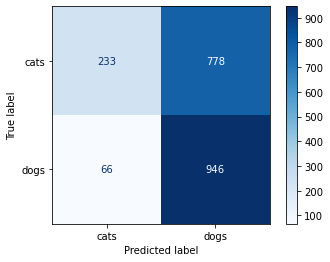

In [68]:
cm = confusion_matrix(test_labels,predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [71]:
#missclassified dogs. 
778/(946 + 778)

0.45127610208816704

In [72]:
#missclassified cats. 
66/(233+66)

0.22073578595317725

In [70]:
from sklearn.metrics import classification_report
print(classification_report(test_labels,predictions, target_names = class_names))

              precision    recall  f1-score   support

        cats       0.78      0.23      0.36      1011
        dogs       0.55      0.93      0.69      1012

    accuracy                           0.58      2023
   macro avg       0.66      0.58      0.52      2023
weighted avg       0.66      0.58      0.52      2023



In [82]:
def classification_evaluation(classification, predictions, test_labels, test_images):
    if classification== "correct":
        indices_list = np.where(predictions == test_labels)[0]
    else:
        indices_list = np.where(predictions!= test_labels)[0]
    test_images_filtered= [test_images[i] for i in indices_list]
    images_labels_original= [test_labels[i] for i in indices_list]
    images_labels_predicted= [predictions[i] for i in indices_list]
    print(f"{len(test_images_filtered)} images were classified {classification.upper()} out of a total of {len(test_images)} in the Test dataset")

    unique, counts = np.unique(images_labels_original, return_counts=True)
    #for i in (0,1):
        #print(f"for category {unique[i]} the number of {classification.upper()} classified images were: {counts[i]}")
        
    # Plot some of the misclassified images
    print("\n\n")
    fig,ax=plt.subplots(5,2)
    fig.suptitle(f"Sample of {classification.upper()} Classified Images", fontsize=20)
    fig.set_size_inches(15,15)
    for i in range(5):
        for j in range (2):
            l=random.randint(0,len(test_images_filtered))
            ax[i,j].imshow(test_images_filtered[l])
            ax[i,j].set_title("Predicted: "+str(images_labels_predicted[l])+"\n"+"Actual: "+str(images_labels_original[l]))
    plt.tight_layout()

844 images were classified INCORRECT out of a total of 2023 in the Test dataset





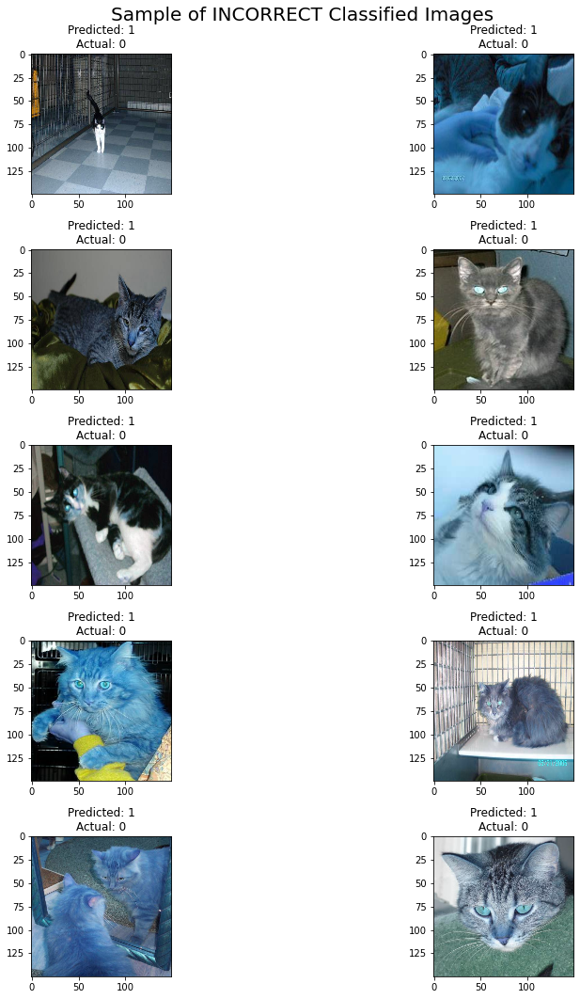

In [83]:
classification_evaluation("incorrect",predictions, test_labels, test_images)

In [84]:
844/2023

0.4172021749876421

In [87]:
print("41% of the data was missclassified")

41% of the data was missclassified


1179 images were classified CORRECT out of a total of 2023 in the Test dataset





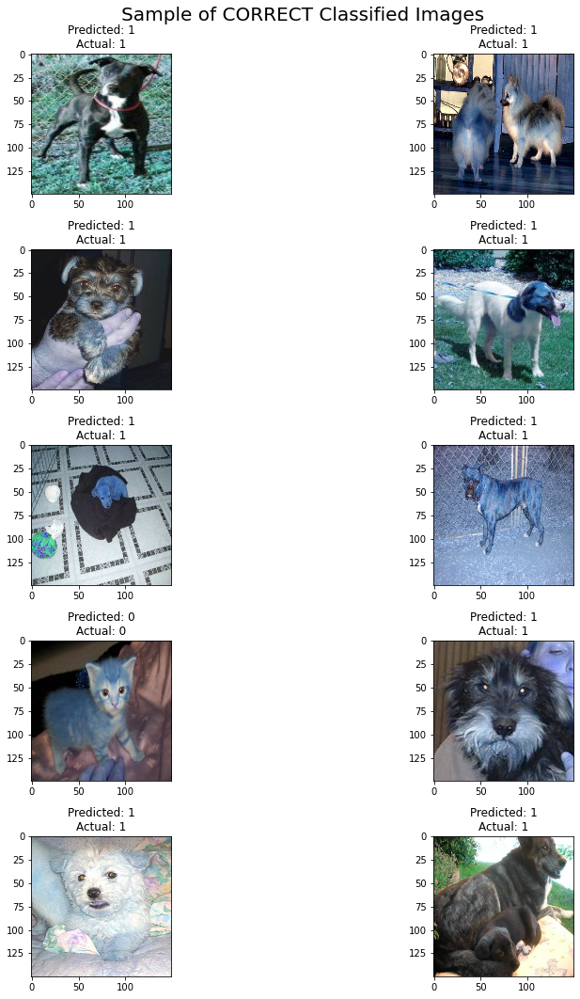

In [88]:
classification_evaluation("correct",predictions, test_labels, test_images)

In [89]:
1179/2023

0.5827978250123579

In [90]:
print('58% of the data was well classified')

58% of the data was well classified
